In [1]:
# Remember: library imports are ALWAYS at the top of the script, no exceptions!
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder, OrdinalEncoder, RobustScaler
import category_encoders as ce
from pandas_profiling import ProfileReport
import datetime
import pandas_profiling
from datetime import datetime
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import warnings
warnings.filterwarnings('ignore')
pd.options.display.max_columns = None
pd.set_option('display.max_rows', 200)

In [2]:
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from sklearn.base import clone
from sklearn.metrics import pairwise_distances
from scipy.cluster.hierarchy import dendrogram
from sklearn.manifold import TSNE
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from collections import Counter

In [3]:
from sklearn.neighbors import LocalOutlierFactor
from numpy import quantile, where, random

In [4]:
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import AgglomerativeClustering, KMeans
from scipy.cluster.hierarchy import dendrogram
import matplotlib.cm as cm
from yellowbrick.cluster import KElbowVisualizer

In [7]:
#pip install yellowbrick

* [Exclusion with Correlation](#corr)
* [Endoding](#enc)
* [Imputation for Outliers](#imput)
* [Scaling and Normalization for Outliers](#scal_norm)
* [Outliers](#outl)
* [PCA](#pca)
* [Division of variables](#div)
* [K-mean Hierarchical](#hier)
* [R2-score](#r2)
<a class="anchor" id="none">

In [5]:
data = pd.read_csv('donors.csv')
data.head(3)

,Unnamed: 0,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,NOEXCH,RECINHSE,RECP3,RECPGVG,RECSWEEP,MDMAUD,DOMAIN,HOMEOWNR,CHILD03,CHILD07,CHILD12,CHILD18,NUMCHLD,INCOME,GENDER,WEALTH1,HIT,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,DATASRCE,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,SOLP3,SOLIH,MAJOR,WEALTH2,GEOCODE,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,LIFESRC,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH8,ETH9,ETH10,ETH11,ETH12,ETH13,ETH14,ETH15,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE4,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_15,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_20,ADATE_21,ADATE_22,ADATE_23,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RDATE_3,RDATE_4,RDATE_5,RDATE_6,RDATE_7,RDATE_8,RDATE_9,RDATE_10,RDATE_11,RDATE_12,RDATE_13,RDATE_14,RDATE_15,RDATE_16,RDATE_17,RDATE_18,RDATE_19,RDATE_20,RDATE_21,RDATE_22,RDATE_23,RDATE_24,RAMNT_3,RAMNT_4,RAMNT_5,RAMNT_6,RAMNT_7,RAMNT_8,RAMNT_9,RAMNT_10,RAMNT_11,RAMNT_12,RAMNT_13,RAMNT_14,RAMNT_15,RAMNT_16,RAMNT_17,RAMNT_18,RAMNT_19,RAMNT_20,RAMNT_21,RAMNT_22,RAMNT_23,RAMNT_24,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
0,0,2009-01-01,GRI,0,IL,61081,,,1957-12-01,0,,,,,XXXX,T2,,,,,,NaN,NaN,F,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,0,39,34,18,10,2,1,,,,5.0,,,,,,,,,,,,,,,,,,,,,X,992,264,332,0,35,65,47,53,92,1,0,0,11,0,0,0,0,0,0,0,11,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,23,23,23,15,1,0,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,0,0,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,99,0,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,0,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,0,120,16,10,39,21,8,4,3,5,20,3,19,4,0,0,0,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,0,0,90,0,10,0,0,0,33,65,40,99,99,6,2,10,7,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,

In [6]:
data.drop(['Unnamed: 0'], axis=1, inplace=True)

In [7]:
data.shape[0]

95412

In [8]:
df = data.copy() 

In [9]:
any(df.duplicated())

False

In [10]:
df.drop(df.loc[df['MAILCODE']=='B'].index, inplace=True)
df.drop(['MAILCODE'], axis = 1, inplace = True)

In [11]:
df.shape[0]/data.shape[0]

0.9853372741374251

In [12]:
df.drop(['DATASRCE', 'LIFESRC', 'NOEXCH', 'WEALTH1', ], axis = 1, inplace = True) 
df.drop(df.loc[df['SOLP3']=='00'].index, inplace=True)
df.drop(df.loc[df['SOLIH']=='00'].index, inplace=True)

In [13]:
df.shape[0]/data.shape[0]

0.9817737810757556

In [14]:
df['DOB'] = 2017 - df['DOB'].str[:4].fillna(0).astype(int)
df['DOB'] = df['DOB'].replace(2017, np.nan)
df['DOB'].isna().sum()

23292

In [15]:
df=df.rename(columns={'DOB':'AGE'}) 

In [16]:
df['ETH4']= df['ETH12']+ df['ETH4']
df['ETH5']= df['ETH5']+df['ETH13']+ df['ETH14']+ df['ETH15'] + df['ETH16']
df['ETH6']= df['ETH6']+df['ETH8']+ df['ETH9']+ df['ETH10'] + df['ETH11']
df.drop(['ETH12', 'ETH13', 'ETH14', 'ETH15','ETH16', 'ETH8', 'ETH9', 'ETH10', 'ETH11'], axis = 1, inplace = True)

df['IC7']= df['IC7']+df['IC8']
df['IC8']= df['IC9']+df['IC10']
df['IC9']= df['IC11']+df['IC12']
df.drop(['IC10', 'IC11', 'IC12'], axis = 1, inplace = True)

In [17]:
df = df[df.POP901 >0] #it must have at least someone 

In [18]:
df.shape[0]/data.shape[0]

0.9737139982392152

In [19]:
df.drop(['TPE4', 'TPE5', 'TPE6', 'TPE7', 'EIC2', 'OEDC7', 'AFC1', 'AFC2', 'AFC3','HC9','HC10','HC15'], axis=1, inplace=True) #large number of zeros
df.drop(['LFC8', 'LFC9'], axis=1, inplace=True) #many extreme percentages 0 and 100% 
df.drop('GEOCODE2', axis=1, inplace=True) #we have no information of what the codes mean
df.drop(['RECINHSE', 'RECP3', 'RECPGVG', 'RECSWEEP', 'PVASTATE','SOLP3', 'SOLIH', 'GEOCODE'], axis=1, inplace=True) #too many null values (not defined as nan by default)
df.drop(['RFA_2R'], axis=1, inplace=True) #RFA_2R - constant value
df.drop(['MALEMILI','MALEVET','VIETVETS','WWIIVETS','LOCALGOV','STATEGOV','FEDGOV'], axis=1, inplace=True) #not related to the census, can't really understand to each population it refers to 
df=df.reset_index(drop=True)
for index in range(len(df)):
    if pd.isna(df['NUMCHLD'][index]):
        if ((df['CHILD03'][index]==' ' and df['CHILD07'][index]==' ') and (df['CHILD12'][index]==' ' and df['CHILD18'][index]==' ')):
            df['NUMCHLD'][index] = 0
            
df.drop(['CHILD03', 'CHILD07','CHILD12','CHILD18'], axis=1, inplace=True)
df[['ZIP','null']] = df.ZIP.str.split("-",1, expand=True)
df.drop(['null'], axis=1, inplace=True)
df.ZIP = df.ZIP.astype('int')

In [20]:
df.NUMCHLD.isna().sum()

1525

In [ ]:
percent_missing = df.isnull().sum() * 100 / len(df)
missing_value_df = pd.DataFrame({'column_name': df.columns,
                                 'percent_missing': percent_missing})
for index in range(len(missing_value_df)):
    if missing_value_df['percent_missing'][index]>=45:
        df.drop(missing_value_df['column_name'][index], axis=1, inplace=True)

In [22]:
#find which columns represent booleans
bools=[]
for col in df:
    if len(df[col].unique()) == 2:
        bools.append(col)

#find wich columns are dates
dates = df.filter(like='DATE').columns

#tranform those dates into datetime and then into days
df[dates] = df[dates].apply(pd.to_datetime)
df[dates] = (datetime(2017, 12, 31) - df[dates]) #CONFIRMAR ESTE DIA
df[dates]= df[dates].astype('timedelta64[D]')

#transform booleans to binary
df[bools]=df[bools].replace([' ','U'],0)
df[bools]=df[bools].replace(['X','Y','H'],1)
df

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,AGE,MDMAUD,DOMAIN,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC11,HC12,HC13,HC14,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_21,ADATE_22,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A
0,3286.0,GRI,0,IL,61081,60.0,XXXX,T2,,0.0,NaN,F,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,992,264,332,0,35,65,47,53,92,1,0,0,22,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,46,38,1,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,120,16,10,39,21,8,4,3,5,20,3,19,4,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,90,0,10,0,0,33,65,40,99,99,6,2,10,7,213.0,578.0,639.0,639.0,670.0,699.0,730.0,791.0,822.0,822.0,883.0,914.0,944.0,1036.0,1064.0,1095.0,1156.0,1187.0,1217.0,1309.0,L4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,27,333.0,74,6,14,240.0,31,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2982.0,2862.0,4.0,7.741935,95515,0,4,E,X,X,X
1,1460.0,BOA,1,CA,91326,45.0,XXXX,S1,H,1.0,6.0,M,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3611,940,998,99,0,0,50,50,67,0,0,31,13,28,2,34,41,43,32,42,45,32,33,46,21,13,14,33,23,10,4,2,11,16,36,22,15,12,1,5,4,21,75,55,23,9,69,4,3,24,317,360,99,99,0,0,0,0,0,0,0,5468,5218,12,10,96,4,97,3,9,59,94,88,55,95,5,4,1,3,5,4,2,18,44,5,0,0,0,97,98,98,98,99,94,0,83,76,73,21,5,0,0,0,4,0,0,0,91,91,91,94,4480.0,13.0,803.0,1088,1096,1026,1037,36175,2,8,20,27,10,33,2,5,2,5,15,14,14,10,32,6,2,66,3,56,44,9,80,14,0,0,6,0,2,24,32,12,71,70,83,58,81,57,64,57,0,22,24,4,21,13,2,1,6,0,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,160,5,5,12,21,7,30,20,14,24,4,24,10,8,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,42,39,50,7,27,16,99,92,53,5,10,2,26,56,97,99,0,96,0,4,0,0,99,0

In [23]:
#turn variables into binary
bols = ['HOMEOWNR']
df[bols]=df[bols].replace([' ','U'],0)
df[bols]=df[bols].replace(['H'],1)
df

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,AGE,MDMAUD,DOMAIN,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC11,HC12,HC13,HC14,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_21,ADATE_22,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A
0,3286.0,GRI,0,IL,61081,60.0,XXXX,T2,0,0.0,NaN,F,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,992,264,332,0,35,65,47,53,92,1,0,0,22,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,46,38,1,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,120,16,10,39,21,8,4,3,5,20,3,19,4,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,90,0,10,0,0,33,65,40,99,99,6,2,10,7,213.0,578.0,639.0,639.0,670.0,699.0,730.0,791.0,822.0,822.0,883.0,914.0,944.0,1036.0,1064.0,1095.0,1156.0,1187.0,1217.0,1309.0,L4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,27,333.0,74,6,14,240.0,31,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2982.0,2862.0,4.0,7.741935,95515,0,4,E,X,X,X
1,1460.0,BOA,1,CA,91326,45.0,XXXX,S1,1,1.0,6.0,M,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3611,940,998,99,0,0,50,50,67,0,0,31,13,28,2,34,41,43,32,42,45,32,33,46,21,13,14,33,23,10,4,2,11,16,36,22,15,12,1,5,4,21,75,55,23,9,69,4,3,24,317,360,99,99,0,0,0,0,0,0,0,5468,5218,12,10,96,4,97,3,9,59,94,88,55,95,5,4,1,3,5,4,2,18,44,5,0,0,0,97,98,98,98,99,94,0,83,76,73,21,5,0,0,0,4,0,0,0,91,91,91,94,4480.0,13.0,803.0,1088,1096,1026,1037,36175,2,8,20,27,10,33,2,5,2,5,15,14,14,10,32,6,2,66,3,56,44,9,80,14,0,0,6,0,2,24,32,12,71,70,83,58,81,57,64,57,0,22,24,4,21,13,2,1,6,0,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,160,5,5,12,21,7,30,20,14,24,4,24,10,8,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,42,39,50,7,27,16,99,92,53,5,10,2,26,56,97,99,0,96,0,4,0,0,99,


<a class="anchor" id="corr">

In [24]:
blacklist=[]
corr_matrix=df.corr()
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[j, i]) > 0.85:
            colname = corr_matrix.columns[i]
            rowname = corr_matrix.columns[j]
            
            if colname in blacklist or rowname in blacklist:
                continue
            list1 = []
            list2 = []
            for k, index in enumerate(corr_matrix[colname]):
                if(corr_matrix.columns[k] not in blacklist):
                    list1.append(1-abs(index)) 
            for k, index in enumerate(corr_matrix[rowname]):
                if(corr_matrix.columns[k] not in blacklist):
                    list2.append(1-abs(index))
            if sum(list1)>sum(list2):
                blacklist.append(colname)
                df.drop(colname, axis=1, inplace=True)

            else:
                blacklist.append(rowname)
                df.drop(rowname, axis=1, inplace=True)
                
for column in corr_matrix.columns:
    if (corr_matrix[column]< 0.1).all() is True:
        corr_matrix.drop(column, axis=1, inplace=True)
        df.drop(column, axis=1, inplace=True)

In [25]:
df.drop(df.loc[:,'ADATE_2':'RFA_24'], axis=1, inplace =True)   
#RFA has a high degree of cardinality
#we have other more important dates than to know for each gift

df.drop(['OSOURCE', 'DOMAIN', 'MDMAUD'], axis=1, inplace=True) #high cardinality
#Domain has other variables that explain this, is redundant 
#MDMAUD we have other values that contain this information (the other MDMAUD_)

df.drop(['HVP5',  # we already have the median home value, it's skewed
         'IC7','IC8', 'IC16', 'IC17', 'IC18', 'IC19','IC20','IC21','IC23','IC22',  #we have the income per capita and other values that explain this
         'TPE11'], axis=1, inplace=True)  #drop the average bc we have the median and it's slightly skewed

df.drop(['HHD11',  #we have hhd10 and hhd3, redundant
         'ETHC1','ETHC2','ETHC3','ETHC5','ETHC6'], axis=1, inplace=True)   #we have other variables that explain this information

df.drop(['TCODE', 'HPHONE_D'], axis=1, inplace=True)
df.drop(['MDMAUD_F', 'MDMAUD_R', 'MDMAUD_A'], axis=1, inplace=True) 
df_ = df.replace(' ', np.nan)  

In [26]:
df_.GENDER.value_counts()

F    50000
M    38052
U     1673
J      357
C        2
A        2
Name: GENDER, dtype: int64

In [27]:
df_.GENDER.fillna('U', inplace = True)  

df_.drop(df_[df_.GENDER == 'C'].index, inplace=True)  #in metadata there is no reference to these two values
df_.drop(df_[df_.GENDER == 'A'].index, inplace=True)

df_.GENDER = df_.GENDER.replace(['F'],0)
df_.GENDER = df_.GENDER.replace(['M'],1)
df_.GENDER = df_.GENDER.replace(['U','J'],2)

In [28]:
df

,STATE,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A
0,IL,60.0,0,0.0,NaN,F,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,0.0,177.0,682.0,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,E
1,CA,45.0,1,1.0,6.0,M,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,4480.0,13.0,803.0,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,G
2,NC,NaN,0,0.0,3.0,M,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,0.0,281.0,518.0,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,E
3,CA,69.0,0,0.0,1.0,F,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,9340.0,67.0,862.0,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,E
4,FL,77.0,1,1.0,3.0,F,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,5000.0,127.0,528.0,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,3,12,5,2,26,1,20,7,28,4,9,16,53,20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,65,0,0,0,90,45,18,25,0,3,67,9,14,72,3,0,1,21,99,96,6,2,7,11,333.0,10,25,254.0,8,3.0,1552.0,15.0,730.

### Encode variables

<a class="anchor" id="enc">

In [29]:
df_.RFA_2A.value_counts()

F    45838
E    21083
G    18743
D     7236
Name: RFA_2A, dtype: int64

In [30]:
 # create object of Ordinalencoding to deal with the variable education level
encoder= ce.OrdinalEncoder(cols=['RFA_2A'],return_df=True,
                           mapping=[{'col':'RFA_2A',
'mapping':{'D':0, 'E':1, 'F':2, 'G':3}}])

#fit and transform train data 
df_transformed = encoder.fit_transform(df_)
#check
df_transformed.RFA_2A.value_counts() 

2    45838
1    21083
3    18743
0     7236
Name: RFA_2A, dtype: int64

In [31]:
#keep only the top 5 states
df_transformed.STATE = df_transformed.STATE.replace(['NC', 'AL', 'IN', 'LA', 'IA', 'TN', 'KS', 'MN',
       'UT', 'MO', 'OR', 'WA', 'WI', 'GA', 'OK', 'KY', 'MD',
       'SD', 'NV', 'NE', 'AZ', 'VA', 'SC', 'ND', 'AK', 'AR', 'NM', 'MT',
       'MS', 'CO', 'HI', 'ME', 'WY', 'ID', 'OH', 'NJ', 'MA', 'VT', 'NY',
       'PA', 'DC', 'CT', 'DE', 'WV', 'RI', 'AA', 'NH'],'Others')

#'IL', 'CA', 'FL', 'TX', 'MI'

In [32]:
df_transformed.STATE.value_counts()

Others    48646
CA        16991
FL         8154
TX         7284
IL         6293
MI         5532
Name: STATE, dtype: int64

In [33]:
df_ohc= df_transformed.copy()

one_hot_feat= ["STATE"]
ohc= OneHotEncoder(sparse=False)
ohc_feat= ohc.fit_transform(df_ohc[one_hot_feat])
ohc_feat_names= ohc.get_feature_names(["STATE"])
ohc_df = pd.DataFrame(ohc_feat, index=df_ohc.index, columns=ohc_feat_names)
df_ohc = pd.concat([df_ohc.drop(columns=one_hot_feat), ohc_df], axis=1)
df_ohc

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,0.0,177.0,682.0,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,1,0.0,0.0,1.0,0.0,0.0,0.0
1,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,4480.0,13.0,803.0,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,3,1.0,0.0,0.0,0.0,0.0,0.0
2,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,0.0,281.0,518.0,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,1,0.0,0.0,0.0,0.0,1.0,0.0
3,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,9340.0,67.0,862.0,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,1,1.0,0.0,0.0,0.0,0.0,0.0
4,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,5000.0,127.0,528.0,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,3,12,5,2,26,1,20,7,28,4,9,16,53,

In [34]:
df_=df_ohc.copy()

### Imputation of the nan values and normalization for outlier removal

<a class="anchor" id="imput">

In [35]:
numeric_data = df_.select_dtypes(include=[np.number]).columns.to_list()
categorical_data = df_.columns.drop(numeric_data).to_list()
df_[numeric_data]

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,0.0,177.0,682.0,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,1,0.0,0.0,1.0,0.0,0.0,0.0
1,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,4480.0,13.0,803.0,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,3,1.0,0.0,0.0,0.0,0.0,0.0
2,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,0.0,281.0,518.0,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,1,0.0,0.0,0.0,0.0,1.0,0.0
3,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,9340.0,67.0,862.0,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,1,1.0,0.0,0.0,0.0,0.0,0.0
4,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,5000.0,127.0,528.0,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,3,12,5,2,26,1,20,7,28,4,9,16,53,

In [36]:
df_[numeric_data].isna().sum().tail(200)

STEREO             0
PCOWNERS           0
PHOTO              0
CRAFTS             0
FISHER             0
GARDENIN           0
BOATS              0
WALKER             0
KIDSTUFF           0
CARDS              0
PLATES             0
PEPSTRFL           0
POP903             0
POP90C1            0
POP90C2            0
POP90C3            0
POP90C5            0
ETH1               0
ETH3               0
ETH7               0
CHIL2              0
CHIL3              0
AGEC1              0
AGEC2              0
AGEC3              0
AGEC4              0
AGEC5              0
CHILC1             0
CHILC2             0
CHILC3             0
CHILC4             0
CHILC5             0
HHN2               0
HHN6               0
MARR2              0
MARR3              0
MARR4              0
DW2                0
DW3                0
DW7                0
DW8                0
DW9                0
HU2                0
HU4                0
HU5                0
HHD3               0
HHD6               0
HHD8         

In [37]:
df_outliers = df_.apply(lambda x: x.fillna(x.median()),axis=0)
df_outliers

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,60.0,0,0.0,4.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,0.0,177.0,682.0,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,1,0.0,0.0,1.0,0.0,0.0,0.0
1,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,4480.0,13.0,803.0,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,3,1.0,0.0,0.0,0.0,0.0,0.0
2,59.0,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,0.0,281.0,518.0,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,1,0.0,0.0,0.0,0.0,1.0,0.0
3,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,9340.0,67.0,862.0,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,1,1.0,0.0,0.0,0.0,0.0,0.0
4,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,5000.0,127.0,528.0,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,3,12,5,2,26,1,20,7,28,4,9,16,53

In [38]:
std_data=df_outliers.copy()

df_.set_index(['CONTROLN'],inplace=True)
df_

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,0.0,177.0,682.0,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,4,1,0.0,0.0,1.0,0.0,0.0,0.0
148535,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,4480.0,13.0,803.0,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,2,3,1.0,0.0,0.0,0.0,0.0,0.0
15078,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,0.0,281.0,518.0,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,4,1,0.0,0.0,0.0,0.0,1.0,0.0
172556,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,9340.0,67.0,862.0,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,4,1,1.0,0.0,0.0,0.0,0.0,0.0
7112,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9

The reason why we decided to use robust scaler.
1st scale the data
2nd eliminate outliers. 
Depois no report explicar que este é o mais indicado para se tratar dos outliers.

<a class="anchor" id="scal_norm">
https://www.kaggle.com/mikalaichaly/compare-different-scalers-on-data-with-outliers

In [39]:
numeric_data.remove('CONTROLN')
std_data.reset_index(drop=True, inplace=True)


In [40]:
#from sklearn.preprocessing import MinMaxScaler   #fazer com o outro  ROBUSTSCALER E DEPOIS OUTLIERS
scaler = RobustScaler()
std_data[numeric_data] = pd.DataFrame(scaler.fit_transform(std_data[numeric_data]), columns = numeric_data)
std_data

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,0.052632,-1.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850,95515,1.5,-1.0,0.0,0.0,1.0,0.0,-1.0,0.0
1,-0.736842,0.0,1.0,1.0,1.0,5.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25,0.0,0.0,0.5,-0.333333,-0.6,0.714286,-0.019342,0.888889,

In [41]:
std_data.set_index(['CONTROLN'],inplace=True) #unique number 

#meter no df_ depois dos outliers tambem
std_data

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.052632,-1.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850,1.5,-1.0,0.0,0.0,1.0,0.0,-1.0,0.0
148535,-0.736842,0.0,1.0,1.0,1.0,5.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.

In [42]:
std_data.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 92900 entries, 95515 to 185114
Data columns (total 213 columns):
AGE             92900 non-null float64
HOMEOWNR        92900 non-null float64
NUMCHLD         92900 non-null float64
INCOME          92900 non-null float64
GENDER          92900 non-null float64
HIT             92900 non-null float64
MAJOR           92900 non-null float64
COLLECT1        92900 non-null float64
VETERANS        92900 non-null float64
BIBLE           92900 non-null float64
CATLG           92900 non-null float64
HOMEE           92900 non-null float64
PETS            92900 non-null float64
CDPLAY          92900 non-null float64
STEREO          92900 non-null float64
PCOWNERS        92900 non-null float64
PHOTO           92900 non-null float64
CRAFTS          92900 non-null float64
FISHER          92900 non-null float64
GARDENIN        92900 non-null float64
BOATS           92900 non-null float64
WALKER          92900 non-null float64
KIDSTUFF        92900 non-n

In [43]:
std_data.corr(method='spearman')

KeyboardInterrupt: 

In [44]:
corr_matrix=std_data.corr()
corr_features =[]
for i in range(len(corr_matrix .columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) >= 0.80:
            colname = corr_matrix.columns[i]
            rowname = corr_matrix.columns[j]
            corr_features.append((colname, rowname))

In [45]:
corr_features

[('HHD3', 'HU2'), ('HUPA6', 'HU2'), ('VOC2', 'HHD3'), ('VOC3', 'VOC2')]

In [46]:
numeric_data = std_data.select_dtypes(include=[np.number]).copy()
categorical_data = std_data.columns.drop(numeric_data).to_list()

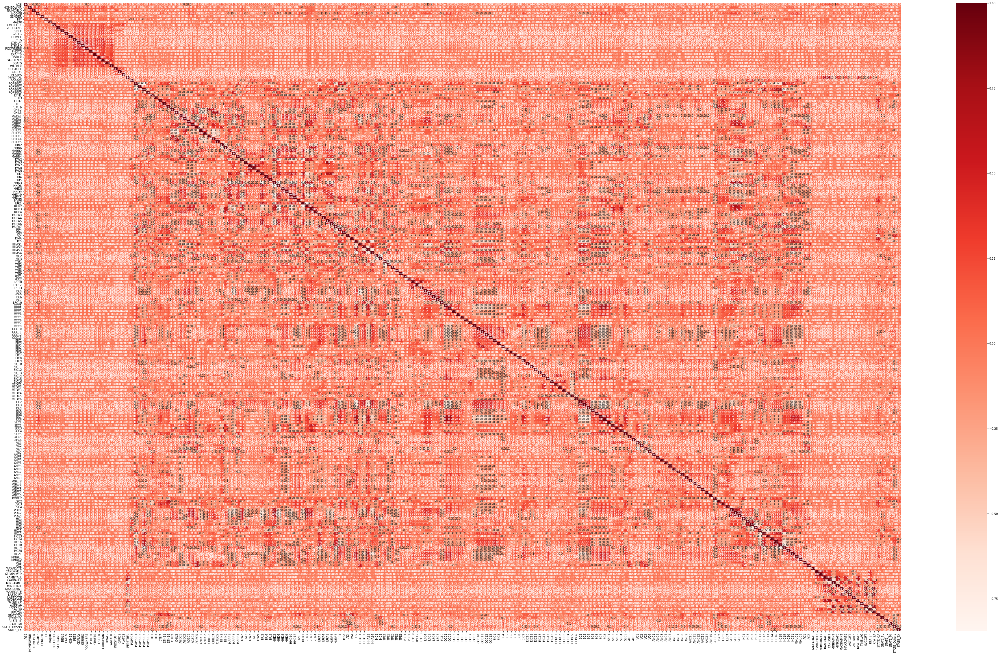

In [72]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(68,40))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = numeric_data.corr(method ='spearman')
cor_heatmap(cor_spearman)

#do this after the split in different types and see which ones can be dropped


In [47]:
std_data.shape[0]/data.shape[0] 

0.9736720747914308

In [48]:
std_data.describe(include='all')

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
count,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.00000,92900.000000,92900

### Outliers

<a class="anchor" id="outl">

In [49]:
import seaborn as sns
from math import ceil

In [50]:
numeric_data = std_data.select_dtypes(include=[np.number]).copy()

In [51]:
numeric_data.drop(['HOMEOWNR','GENDER',
 'COLLECT1',
 'VETERANS',
 'BIBLE',
 'CATLG',
 'HOMEE',
 'PETS',
 'CDPLAY',
 'STEREO',
 'PCOWNERS',
 'PHOTO',
 'CRAFTS',
 'FISHER',
 'GARDENIN',
 'BOATS',
 'WALKER',
 'KIDSTUFF',
 'CARDS',
 'PLATES',
 'PEPSTRFL',
 'STATE_CA',       
'STATE_FL',        
'STATE_IL',       
'STATE_MI',        
'STATE_Others','STATE_TX', 'RFA_2A', 'MAJOR','RFA_2F'], axis=1, inplace=True)

#encoders and binaries are not metric features

In [52]:
df_outliers2 = numeric_data.copy()

q25 = df_outliers2.quantile(.25)
q75 = df_outliers2.quantile(.75)
iqr = (q75 - q25) * 2.5

upper_lim = q75 + 7 * iqr
lower_lim = q25 - 7 * iqr

filters = []
for metric in numeric_data:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters.append(df_outliers2[metric].between(llim, ulim, inclusive=True))

df_outliers3 = df_outliers2[np.all(filters, 0)]
print('Percentage of data kept after removing outliers:', np.round(df_outliers3.shape[0] / data.shape[0], 4))

#too much data lost

Percentage of data kept after removing outliers: 0.1745


In [53]:
from scipy import stats

In [54]:
z_scores = stats.zscore(df_outliers2)
abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 10).all(axis=1)
new_df = df_outliers[filtered_entries]

print('Percentage of data kept after removing outliers:', np.round(new_df.shape[0] / data.shape[0], 4))

new_df

Percentage of data kept after removing outliers: 0.931


,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,60.0,0,0.0,4.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,0.0,177.0,682.0,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,1,0.0,0.0,1.0,0.0,0.0,0.0
1,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,4480.0,13.0,803.0,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,3,1.0,0.0,0.0,0.0,0.0,0.0
2,59.0,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,0.0,281.0,518.0,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,1,0.0,0.0,0.0,0.0,1.0,0.0
3,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,9340.0,67.0,862.0,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,1,1.0,0.0,0.0,0.0,0.0,0.0
4,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,5000.0,127.0,528.0,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,3,12,5,2,26,1,20,7,28,4,9,16,53

In [55]:
df_outliers2[filtered_entries == False]

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
134891,0.578947,0.0,0.0,5.666667,-0.453856,-1.000000,99.0,0.000000,-0.666667,0.333333,1.0,0.0,1.333333,0.166667,2.8,-0.875,-0.142857,0.00,-0.2,-0.666667,-0.666667,0.75,0.75,0.25,-0.571429,5.666667,-1.4,-0.8,1.375,0.257143,2.000000,0.0,0.0,0.0,-0.12,0.000,0.1250,0.75,-0.272727,-1.0,-0.2,-0.857143,0.75,0.0,0.0,1.5,1.5,1.0,0.000000,-0.444444,0.428571,0.466667,0.0,-0.166667,-0.615809,0.542056,0.567227,-0.728914,0.058824,-0.666667,0.000000,0.272727,0.25,0.250000,0.250000,-0.625,0.0,1.00,0.000000,-0.5,-0.260870,-1.571429,-0.4,-2.227273,-0.1875,-0.5625,0.352941,0.30,-0.444444,0.6,-0.555556,0.333333,1.166667,-0.428571,0.0,1.5,1.333333,-0.750,-0.714286,1.25,-0.333333,1.00,-1.00,-0.923077,-0.25,1.333333,0.50,0.714286,-0.2,-0.333333,3.0,1.5,-1.0,2.0,-0.25,0.75,0.6,2.00,0.333333,0.4,-0.769231,0.0,-0.666667,-0.727273,-1.071429,0.555556,0.6,1.461538,1.428571,-0.75,3.125,0.0,1.000000,3.50,-1.000000,-0.5,-1.294118,1.181818,2.095238,-0.750000,0.0,8.8,-1.0,-0.250,0.0,0.0,-0.75,-0.5,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.68750,-0.25,1.0,-0.333333,0.571429,1.041667,1.466667,1.2,2.000000,0.466667,-0.057692,-0.323944,-0.285714,-0.153846,9.50,1.8,-0.055556,0.076923,0.0,-0.4,-0.666667,0.0,-0.666667,0.50,0.0,0.0,-0.5,-0.033333,-0.2,0.000000,0.059317,-0.222222,0.399123,0.0,1.196078,-0.254632,-0.333333,-0.151177
190166,0.000000,0.0,0.0,0.000000,0.149178,-0.656566,0.0,1.222222,0.000000,-0.133333,0.0,0.0,-0.833333,0.500000,-0.6,0.000,-0.285714,0.00,1.6,0.333333,0.333333,-0.50,-0.25,0.25,2.285714,-0.333333,-0.4,-0.8,-0.500,0.000000,-0.333333,0.0,0.0,0.0,0.12,1.500,3.7500,0.55,-0.272727,0.0,0.2,-0.285714,0.50,0.0,-0.2,0.2,0.0,0.0,0.000000,-0.222222,0.142857,0.933333,0.0,0.400000,0.593750,-0.196262,-0.268908,0.079422,0.235294,-0.166667,0.458333,-0.363636,-2.65,4.250000,1.083333,-0.500,0.0,-0.75,-0.333333,-0.5,0.086957,0.000000,0.2,0.727273,-0.6250,0.2500,-0.117647,0.30,0.000000,0.1,0.111111,0.333333,1.333333,0.285714,0.0,1.5,0.000000,0.000,-0.428571,-0.25,-0.666667,0.00,1.00,-0.538462,0.00,0.333333,0.00,1.857143,-0.2,0.000000,0.0,-0.5,0.2,-0.2,-0.25,0.75,1.2,0.00,0.000000,-0.2,-0.076923,0.4,-0.333333,0.363636,0.642857,0.222222,-0.2,-0.230769,0.142857,0.50,-1.125,0.5,-1.142857,0.00,0.416667,1.0,-0.705882,-0.181818,0.523810,1.083333,1.0,0.2,0.0,0.250,0.0,0.0,0.50,2.5,0.0,2.0,0.0,0.0,-1.0,0.0,1.0,-1.31250,0.00,0.0,2.333333,0.285714,0.541667,0.000000,-1.0,14.333333,2.766667,-0.557692,-0.845070,-0.285714,2.000000,0.00,-0.2,-0.055556,0.076923,0.0,0.2,0.000000,0.0,0.333333,1.75,62.0,-4.0,-4.0,0.033333,-0.4,2.857143,-0.058672,1.444444,0.000000,1.5,1.196078,-0.364017,-0.666667,2.133690
190313,0.000000,0.0,0.0,0.000000,0.065740,0.000000,0.0,0.000000,0.000000,0.066667,0.0,0.0,-0.333333,-0.666667,-0.8,1.500,2.000000,0.25,-1.2,0.333333,1.666667,-0.25,-0.25,-1.00,-1.428571,1.000000,-1.0,-1.2,-0.

### PCA


### Take outliers with PCA
https://www.dummies.com/programming/big-data/data-science/python-for-data-science-developing-a-multivariate-approach-to-find-outliers/
https://stats.stackexchange.com/questions/328109/k-means-does-it-make-sense-to-remove-the-outliers-after-clustering-the-datasets

In [56]:
df_pca1 = numeric_data.copy()
df_pca1

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.052632,0.0,0.0,0.000000,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850
148535,-0.736842,1.0,1.0,5.333333,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25,0.0,0.0,0.5,-0.333333,-0.6,0.714286,-0.019342,0.888889,-0.401316,1.0,0.000000,-0.654513,2.000000,0.572139
15078,0.000000,0.0,-0.5,0.666667,2.630847,-1.000000,2.0,1.814815,0.000000,0.200000,0.0,0.0,0.166667,0.666667,0.2,-0.250,-0.142857,0.50,0.2,-0.166667,-0.666667,-0.50,0.50,1.00,0.285714,-0.333333,-0.2,0.4,-0

In [57]:
# Use PCA to reduce dimensionality of data
pca = PCA()
pca_feat = pca.fit_transform(df_pca1)
pca_feat  

array([[ 2.15786677e+01, -2.71407834e+00,  5.06537693e+00, ...,
         6.85606218e-03, -4.40648524e-02, -4.19495930e-04],
       [-1.58385357e+01,  4.45900453e+01, -3.27244112e+00, ...,
         1.50940244e-03, -4.70821858e-03,  9.66720133e-04],
       [-1.14469926e+01, -5.28313094e+00,  1.64289771e+00, ...,
        -3.01289536e-03, -1.45191116e-02,  4.10900832e-03],
       ...,
       [-1.35362608e+01, -4.31602465e+00, -1.61031567e+00, ...,
        -2.09502670e-02,  1.84187167e-02, -1.98716667e-03],
       [-1.37690970e+01,  1.48855166e+00,  3.40080932e+00, ...,
         4.23984709e-03, -1.42471128e-02, -2.24928056e-04],
       [-1.37312437e+01, -2.02020393e+00, -2.76787507e+00, ...,
         2.81002247e-02, -8.93605836e-03, -9.17099994e-03]])

In [58]:
# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,985.076154,0.000000,6.877532e-01,0.687753
2,86.751504,-898.324650,6.056753e-02,0.748321
3,55.594769,-31.156735,3.881475e-02,0.787135
4,21.831946,-33.762822,1.524247e-02,0.802378
5,19.230548,-2.601399,1.342624e-02,0.815804
6,17.097215,-2.133333,1.193681e-02,0.827741
7,15.322627,-1.774588,1.069784e-02,0.838439
8,12.784897,-2.537729,8.926065e-03,0.847365
9,11.304200,-1.480697,7.892283e-03,0.855257
10,10.805139,-0.499061,7.543853e-03,0.862801


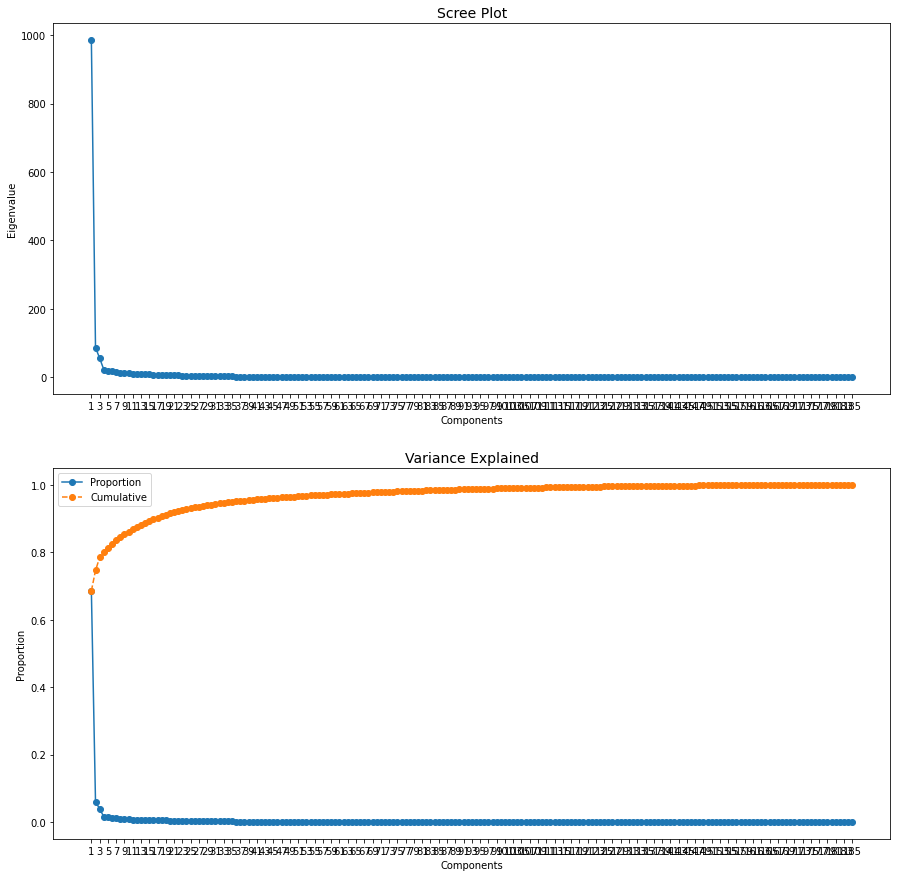

In [86]:
%matplotlib inline
# figure and axes
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 15))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

#6

In [59]:
pca = PCA(n_components=12)
pca_feat = pca.fit_transform(df_pca1)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=df_pca1.index, columns=pca_feat_names)  # remember index=df_pca.index
pca_df

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,
95515,21.578668,-2.714078,5.065377,-4.886623,-1.322065,-3.499856,-0.408976,-2.886812,0.278016,-0.887792,0.882759,-1.158262
148535,-15.838536,44.590045,-3.272441,-0.601761,2.834502,-0.646707,-0.882615,-5.804969,3.415643,-2.519723,3.977280,2.317747
15078,-11.446993,-5.283131,1.642898,-4.074766,4.998304,-1.198001,-0.285113,-1.937573,-3.509934,1.240351,0.761341,-0.637945
172556,-5.768503,0.613014,1.537050,5.485359,8.106165,-1.155808,-0.060995,-6.290736,-3.380813,0.917137,4.240753,-1.592919
7112,-13.519570,-4.301302,-1.688537,1.851837,-1.291038,-0.299232,-2.726764,0.669382,1.361660,-1.270034,14.114887,13.373809
...,...,...,...,...,...,...,...,...,...,...,...,...
184568,-13.621035,-3.308462,-1.570471,3.383854,-0.156147,0.302578,0.225334,1.171772,6.102421,-0.642474,-6.119075,-0.562544
122706,-13.890734,-0.481883,-2.954724,-2.238468,-1.573977,1.989656,0.047230,-3.207173,3.620472,-1.540058,-0.565008,-0.930948
189641,-13.536261,-4.316025,-1.610316,2.529044,-1.523918,-0.039570,-0.663816,-1.957828,1.084408,-1.560419,-0.541083,-0.151409


In [60]:
# Reassigning df to contain pca variables
df_pca1 = pd.concat([df_pca1, pca_df], axis=1)  #df_pca1 em vez disto se calhar devia ser df_[numerical_data] - para nao incluir a normalizacao
df_pca1.head()

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.052632,0.0,0.0,0.000000,-0.323641,-1.0,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.5,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.50,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850,21.578668,-2.714078,5.065377,-4.886623,-1.322065,-3.499856,-0.408976,-2.886812,0.278016,-0.887792,0.882759,-1.158262
148535,-0.736842,1.0,1.0,5.333333,0.518331,0.0,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.0,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.25,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25,0.0,0.0,0.5,-0.333333,-0.6,0.714286,-0.019342,0.888889,-0.401316,1.0,0.000000,-0.654513,2.000000,0.572139,-15.838536,44.590045,-3.272441,-0.601761

In [89]:
metric_features = numeric_data.columns.tolist()

def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_pca1[metric_features + pca_feat_names].corr().loc[metric_features, pca_feat_names]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
AGE,0.039035,0.016014,0.019399,-0.024474,-0.011721,-0.017696,-0.007748,0.104394,-0.071666,0.014802,0.076837,0.079527
NUMCHLD,-0.002574,-0.027837,-0.032151,-0.006787,-0.017996,0.011057,-0.022390,-0.065880,0.050652,-0.048702,0.013994,0.005590
INCOME,-0.072806,0.215343,-0.065912,-0.107969,-0.083847,0.067366,-0.005533,-0.081799,0.197504,-0.043417,0.001207,-0.048137
HIT,0.009362,0.009554,-0.011198,-0.032880,-0.124548,0.028886,-0.080131,0.123279,0.125243,-0.134008,0.651419,0.638065
POP903,0.013516,0.031400,0.021810,0.101787,-0.023511,-0.006258,0.016024,-0.046984,-0.004242,0.077732,-0.244952,-0.092165
POP90C1,-0.546076,0.194847,0.027416,0.307183,-0.474209,-0.012733,-0.006265,0.146281,0.198881,-0.113078,-0.016966,0.020359
POP90C2,0.999897,0.013222,-0.004846,0.001193,-0.000519,0.000637,0.000140,-0.000190,0.000382,-0.000043,0.000376,-0.000671
POP90C3,-0.132178,-0.239714,-0.034330,-0.368441,0.543849,0.011404,0.006545,-0.181072,-0.236486,0.133498,0.005368,-0.016123
POP90C5,0.098677,0.006461,-0.148651,0.009375,-0.227839,-0.055057,-0.008511,0.323575,-0.140525,0.040982,-0.010674,0.053209
ETH1,0.062655,-0.019225,-0.119912,-0.623748,-0.093976,0.184315,-0.010033,0.134167,-0.013669,0.011115,0.014315,-0.108952


In [61]:
df = df_pca1.copy()
df_pca2 = pd.concat([df_pca1, std_data[categorical_data]], axis=1)  #depois arranjar, 
df_pca2

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.052632,0.0,0.0,0.000000,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850,21.578668,-2.714078,5.065377,-4.886623,-1.322065,-3.499856,-0.408976,-2.886812,0.278016,-0.887792,0.882759,-1.158262
148535,-0.736842,1.0,1.0,5.333333,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25,0.0,0.0,0.5,-0.333333,-0.6,0.714286,-0.019342,0.888889,-0.401316,1.0,0.000000,-0.654513,2.000000,0.572139,-15.838536,44.590045,-3.27

In [62]:
# Do this after checking the new pandas profiling report
#df_pca2.drop(columns=['PC11], inplace=True)

In [63]:
pc_features = df_pca2.columns[df_pca2.columns.str.startswith('PC')]#.drop(['PCOWNERS'])
df_pca2[pc_features]

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,
95515,21.578668,-2.714078,5.065377,-4.886623,-1.322065,-3.499856,-0.408976,-2.886812,0.278016,-0.887792,0.882759,-1.158262
148535,-15.838536,44.590045,-3.272441,-0.601761,2.834502,-0.646707,-0.882615,-5.804969,3.415643,-2.519723,3.977280,2.317747
15078,-11.446993,-5.283131,1.642898,-4.074766,4.998304,-1.198001,-0.285113,-1.937573,-3.509934,1.240351,0.761341,-0.637945
172556,-5.768503,0.613014,1.537050,5.485359,8.106165,-1.155808,-0.060995,-6.290736,-3.380813,0.917137,4.240753,-1.592919
7112,-13.519570,-4.301302,-1.688537,1.851837,-1.291038,-0.299232,-2.726764,0.669382,1.361660,-1.270034,14.114887,13.373809
...,...,...,...,...,...,...,...,...,...,...,...,...
184568,-13.621035,-3.308462,-1.570471,3.383854,-0.156147,0.302578,0.225334,1.171772,6.102421,-0.642474,-6.119075,-0.562544
122706,-13.890734,-0.481883,-2.954724,-2.238468,-1.573977,1.989656,0.047230,-3.207173,3.620472,-1.540058,-0.565008,-0.930948
189641,-13.536261,-4.316025,-1.610316,2.529044,-1.523918,-0.039570,-0.663816,-1.957828,1.084408,-1.560419,-0.541083,-0.151409


https://www.dummies.com/programming/big-data/data-science/python-for-data-science-developing-a-multivariate-approach-to-find-outliers/

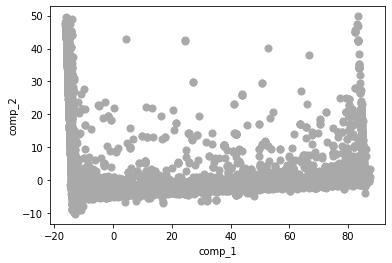

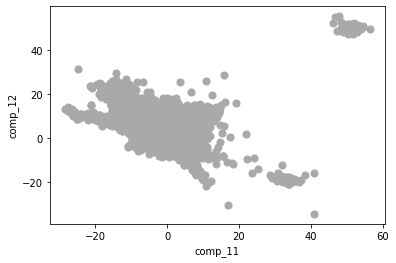

In [93]:
df9 = pd.DataFrame(pca_feat, columns=['comp_'+str(j+1) for j in range(12)])
first_two = df9.plot(kind='scatter', x='comp_1', y='comp_2', c='DarkGrey', s=50)
last_two = df9.plot(kind='scatter', x='comp_11', y='comp_12', c='DarkGrey', s=50)

Looking at these two scatterplots of the first and last components. Looking at the data points along the axis, it can be seen a possible threshold to use for separating regular data from suspect data (possible outliers).

Using the two last components that we kept, it can be located a few points to investigate using the threshold of 1.4 for the last component and of 1.3 for the nith. All cases above these values are possible outliers.


In [94]:
df

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.052632,0.0,0.0,0.000000,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.0,-0.5,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850,21.582011,-2.730909,5.057629,-4.713950,-1.415309,-3.716391,-0.398462,-2.929659,0.201314,-0.881070,0.882849,-1.085159
148535,-0.736842,1.0,1.0,5.333333,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,0.0,1.5,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25,0.0,0.0,0.5,-0.333333,-0.6,0.714286,-0.019342,0.888889,-0.401316,1.0,0.000000,-0.654513,2.000000,0.57

In [95]:
outlying = (pca_feat[:,-1] < 1.4) & (pca_feat[:,-4] < 1.3)
df[outlying]

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.052632,0.0,0.0,0.000000,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.0,-0.5,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850,21.582011,-2.730909,5.057629,-4.713950,-1.415309,-3.716391,-0.398462,-2.929659,0.201314,-0.881070,0.882849,-1.085159
15078,0.000000,0.0,-0.5,0.666667,2.630847,-1.000000,2.0,1.814815,0.000000,0.200000,0.0,0.0,0.0,-0.5,0.166667,0.666667,0.2,-0.250,-0.142857,0.50,0.2,-0.166667,-0.666667,-0.50,0.50,1.00,0.285714,-0.333333,-0.2,0.4,-0.250,-0.085714,0.000000,3.0,3.0,0.0,-0.08,0.125,0.8125,0.15,0.000000,1.0,0.0,-0.142857,-0.25,0.0,0.4,-0.3,0.0,1.0,1.846154,0.111111,0.000000,0.066667,3.0,-1.400000,-0.615809,0.495327,-0.491597,-0.300988,0.117647,0.666667,-0.500000,0.272727,0.45,-0.166667,-0.416667,1.250,0.0,-0.25,0.000000,0.0,0.434783,0.000000,0.4,-0.136364,-0.1250,0.1250,0.705882,0.60,0.000000,-0.3,-0.666667,-0.333333,-1.000000,-0.428571,0.0,0.0,-0.166667,0.875,2.142857,0.25,1.333333,1.25,1.25,1.307692,0.00,0.333333,-0.50,-0.714286,-0.6,-0.333333,-0.5,-0.5,-0.2,0.2,-0.75,-0.25,0.0,1.00,-0.333333,0.2,0.230769,-0.4,1.777778,0.727273,-0.071429,-0.555556,0.0,-0.538462,-0.285714,-0.50,0.000,-0.5,-0.285714,0.00,-0.833333,-0.5,-0.117647,0.454545,0.000000,-0.083333,1.0,1.8,0.0,-0.375,0.0,0.0,0.75,-0.5,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.78125,0.25,0.0,-0.666667,-0.428571,0.083333,0.666667,0.6,1.000000,0.233333,0.038462,-0.845070,0.571429,0.358974,11.00,2.8,4.222222,-1.500000,-2.0,-1.2,0.333333,0.0,0.000000,-0.25,0.0,0.0,1.0,1.388889,2.0,-0.428571,0.431979,-0.111111,2.335526,-1.0,0.000000,0.272564,1.000000,-0.5898

https://www.datasciencelearner.com/projection-detecting-outliers-dbscan-method/

In [64]:
# Based on the hyperparameters found in the previous class
dbscan = DBSCAN(eps=7.3, min_samples=20, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df_pca2[pc_features])
Counter(dbscan_labels)


#5618 com 6
#3634 com 7
#3225 com 7.3

Counter({0: 89467, 1: 205, -1: 3190, 2: 38})

In [98]:
(92900-3225)/data.shape[0]

0.9398712950153021

In [65]:
df_pca2[dbscan_labels==-1]

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
190313,0.000000,0.0,0.0,0.000000,0.065740,0.0,0.0,0.000000,0.000000,0.066667,0.0,0.0,-0.333333,-0.666667,-0.8,1.500,2.000000,0.25,-1.2,0.333333,1.666667,-0.25,-0.25,-1.00,-1.428571,1.000000,-1.0,-1.2,-0.500,0.771429,-0.333333,0.0,0.0,0.0,-0.84,-0.250,-0.1250,1.30,-1.000000,0.0,-0.4,-1.000000,-0.75,1.0,-0.4,1.8,3.0,0.0,0.000000,-0.777778,-0.285714,-0.133333,0.0,0.433333,-0.079044,0.121495,-0.071429,0.802362,-1.235294,-0.666667,0.916667,-0.454545,-1.35,1.250000,0.833333,-0.375,0.0,-0.50,0.000000,0.0,3.086957,2.142857,3.6,0.272727,1.5625,0.7500,0.117647,0.55,-0.444444,2.1,1.333333,0.333333,-0.333333,-0.428571,0.0,0.5,-0.166667,-0.875,-0.571429,-0.75,-1.000000,-0.25,-1.00,0.692308,0.25,0.000000,0.00,-1.285714,0.4,1.333333,-1.5,1.0,0.4,0.2,0.75,0.00,0.4,-0.50,1.000000,-0.4,0.384615,-0.2,-0.666667,-1.000000,-1.214286,0.444444,0.8,2.076923,1.142857,0.50,1.250,2.0,1.000000,0.25,0.500000,0.5,1.647059,-0.636364,-0.761905,0.083333,0.0,-0.2,0.0,0.875,0.0,0.0,-0.25,0.5,0.0,1.0,0.0,0.0,-1.0,1.0,0.0,-0.34375,-0.25,0.5,-0.333333,0.571429,1.166667,0.333333,-0.6,2.000000,2.300000,-0.461538,0.211268,-0.285714,-0.025641,0.00,0.8,0.166667,-0.096154,0.0,0.2,1.333333,2.0,-1.666667,0.00,92.0,-6.0,-5.0,-0.100000,0.4,-0.428571,0.805287,-0.777778,1.932018,-0.8,0.000000,0.272564,0.500000,-0.774323,-13.941221,-1.877237,-3.663977,-4.482053,-6.550763,7.247096,91.066999,-4.339462,5.770685,-0.467465,5.323997,1.883145
146222,0.000000,0.0,0.0,0.000000,-0.428571,0.0,0.0,0.000000,-1.000000,-2.933333,0.0,0.0,-1.000000,1.000000,1.8,1.875,-0.571429,-1.00,-1.4,-0.166667,0.000000,-0.25,-1.00,1.75,-1.285714,4.333333,1.2,-0.2,1.750,-0.742857,2.000000,20.0,0.0,20.0,2.00,0.125,-0.3125,-1.15,2.090909,2.0,1.2,1.428571,1.00,3.5,3.8,-1.6,0.0,4.0,0.000000,1.888889,2.000000,1.933333,0.0,0.133333,0.477022,-0.757009,0.705882,-0.784034,0.058824,2.166667,-0.791667,3.454545,-0.45,1.000000,-2.000000,1.000,6.0,0.50,1.333333,-0.5,0.565217,0.285714,4.4,-1.318182,0.5625,0.0000,-0.588235,-1.15,2.000000,-0.7,-0.333333,-0.333333,-1.166667,-0.571429,2.0,-0.5,0.000000,0.750,0.428571,0.75,1.333333,3.00,-0.50,0.153846,-0.50,0.000000,1.00,-1.571429,0.2,3.000000,2.0,1.0,-1.2,-0.4,0.25,-0.25,0.4,-0.75,0.000000,1.0,0.230769,-0.2,1.777778,2.181818,-0.857143,-1.222222,-0.6,0.000000,-0.714286,1.00,-0.125,0.5,0.285714,-0.25,-0.750000,-0.5,0.588235,-0.454545,0.142857,-0.750000,1.0,-1.0,0.0,-0.875,0.0,0.0,-0.25,1.5,0.0,1.0,0.0,0.0,-1.0,0.0,0.0,-0.46875,11.75,2.0,-0.666667,-2.285714,-1.375000,-1.066667,-0.4,0.000000,-0.533333,1.000000,0.225352,1.285714,-0.230769,0.00,-0.2,-0.055556,0.076923,0.0,-2.0,1.333333,-2.0,0.000000,-0.25,0.0,-2.0,-1.0,-0.111111,-0.2,0.000000,0.941973,-0.222222,0.399123,0.0,1.594771,0.618649,0.500000,-0.293137,-13.464085,0.144736,23.1534

In [66]:
lof = LocalOutlierFactor(n_neighbors=20, contamination=.04)
lof_labels = lof.fit_predict(df_pca2[pc_features])
Counter(lof_labels)

Counter({1: 89184, -1: 3716})

In [67]:
outliers = df_pca2[lof_labels==-1].merge(df_pca2[dbscan_labels==-1], on='CONTROLN')
outliers_ = outliers.merge(df_pca2[filtered_entries == False], on='CONTROLN')
outliers_.index

Int64Index([190313, 185130, 183367,  43238, 191754, 105012, 162938, 190422,
            160343,  13048,
            ...
            159493, 184830,  37761,   7916, 153299, 139169, 190314, 190309,
            139107,  33495],
           dtype='int64', name='CONTROLN', length=374)

In [68]:
(92900-len(outliers_.index))/data.shape[0]  #percentage of data prevailed after taking outliers

0.9697522324235945

### Remove the outliers to the non standardized dataset

In [69]:
df_.drop(outliers_.index, axis=0,inplace=True)
df_

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,0.0,177.0,682.0,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,4,1,0.0,0.0,1.0,0.0,0.0,0.0
148535,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,4480.0,13.0,803.0,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,2,3,1.0,0.0,0.0,0.0,0.0,0.0
15078,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,0.0,281.0,518.0,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,4,1,0.0,0.0,0.0,0.0,1.0,0.0
172556,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,9340.0,67.0,862.0,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,4,1,1.0,0.0,0.0,0.0,0.0,0.0
7112,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9

In [70]:
#df_.to_csv('sem_outliers.csv')

In [5]:
#correr isto para importar o df sem outliers 
df_ = pd.read_csv('sem_outliers.csv')

In [71]:
df_.set_index('CONTROLN', inplace=True)

KeyError: "None of ['CONTROLN'] are in the columns"

In [72]:
df_

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,0.0,177.0,682.0,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,4,1,0.0,0.0,1.0,0.0,0.0,0.0
148535,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,4480.0,13.0,803.0,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,2,3,1.0,0.0,0.0,0.0,0.0,0.0
15078,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,0.0,281.0,518.0,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,4,1,0.0,0.0,0.0,0.0,1.0,0.0
172556,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,9340.0,67.0,862.0,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,4,1,1.0,0.0,0.0,0.0,0.0,0.0
7112,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9

### Divide the data by different perspectives

<a class="anchor" id="div">

In [73]:
df_.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 92526 entries, 95515 to 185114
Data columns (total 213 columns):
AGE             float64
HOMEOWNR        int64
NUMCHLD         float64
INCOME          float64
GENDER          int64
HIT             int64
MAJOR           int64
COLLECT1        int64
VETERANS        int64
BIBLE           int64
CATLG           int64
HOMEE           int64
PETS            int64
CDPLAY          int64
STEREO          int64
PCOWNERS        int64
PHOTO           int64
CRAFTS          int64
FISHER          int64
GARDENIN        int64
BOATS           int64
WALKER          int64
KIDSTUFF        int64
CARDS           int64
PLATES          int64
PEPSTRFL        int64
POP903          int64
POP90C1         int64
POP90C2         int64
POP90C3         int64
POP90C5         int64
ETH1            int64
ETH3            int64
ETH7            int64
CHIL2           int64
CHIL3           int64
AGEC1           int64
AGEC2           int64
AGEC3           int64
AGEC4           int64

#demographic: 'AGE', 'NUMCHLD', 'STATE', 'HOMEOWNR', 'GENDER', 'INCOME', 'STATE_CA', 'STATE_FL', 'STATE_IL', 'STATE_MI', 'STATE_Others', 'STATE_TX'


#summary:  'MAXADATE', 'CARDPM12', 'NUMPRM12', 'RAMNTALL', 'CARDGIFT', 'MINRAMNT', 'MINRDATE', 'MAXRAMNT', 'MAXRDATE', 'LASTGIFT', 'LASTDATE', 'NEXTDATE', 'TIMELAG', 'AVGGIFT', 'RFA_2F',  'RFA_2A', 'MAJOR'


#census: 'POP903', 'POP90C1', 'POP90C2', 'POP90C3', 'POP90C5', 'ETH1', 'ETH3', 'ETH7', 'ETH11', 'ETH16', 'CHIL2', 'CHIL3', 'AGEC1', 'AGEC2', 'AGEC3', 'AGEC4', 'AGEC5', 'CHILC1', 'CHILC2', 'CHILC3', 'CHILC4', 'CHILC5', 'HHN2', 'HHN6', 'MARR2', 'MARR3', 'MARR4', 'DW2', 'DW3', 'DW7', 'DW8', 'DW9', 'HU2', 'HU4', 'HU5', 'HHD3', 'HHD6', 'HHD8', 'HHD9', 'HHD10', 'HHD12', 'HVP6', 'HUR1', 'RHP2', 'RHP3', 'RHP4', 'HUPA3', 'HUPA4', 'HUPA5', 'HUPA6', 'HUPA7', 'RP4', 'MSA', 'ADI', 'DMA', 'IC5', 'HHAS1', 'HHAS2', 'HHAS3', 'HHAS4', 'MC2', 'MC3', 'TPE1', 'TPE2', 'TPE3', 'TPE8', 'TPE9', 'PEC1', 'PEC2', 'TPE10', 'TPE12', 'TPE13', 'LFC4', 'LFC5', 'LFC6', 'LFC7', 'LFC10', 'OCC1', 'OCC2', 'OCC3', 'OCC4', 'OCC5', 'OCC6', 'OCC7', 'OCC8', 'OCC10', 'OCC11', 'OCC12', 'OCC13', 'EIC1', 'EIC3', 'EIC4', 'EIC5', 'EIC6', 'EIC7', 'EIC8', 'EIC9', 'EIC10', 'EIC11', 'EIC12', 'EIC13', 'EIC14', 'EIC15', 'EIC16', 'OEDC1', 'OEDC2', 'OEDC3', 'OEDC4', 'OEDC5', 'OEDC6', 'EC2', 'EC3', 'EC4', 'EC5', 'EC6', 'EC7', 'EC8', 'SEC1', 'SEC2', 'SEC3', 'SEC4', 'SEC5', 'AFC5', 'AFC6', 'VC1', 'VC2', 'VC3', 'VC4', 'ANC1', 'ANC2', 'ANC3', 'ANC4', 'ANC5', 'ANC6', 'ANC7', 'ANC8', 'ANC9', 'ANC10', 'ANC11', 'ANC12', 'ANC13', 'ANC14', 'ANC15', 'POBC2', 'LSC2', 'LSC3', 'LSC4', 'VOC1', 'VOC2', 'VOC3', 'HC1', 'HC3', 'HC5', 'HC8', 'HC11', 'HC12', 'HC13', 'HC14', 'HC16', 'HC18', 'HC19', 'HC20', 'HC21', 'MHUC1', 'MHUC2', 'AC1', 'AC2'    

-PCA?


#interests:  'HIT', 'COLLECT1', 'VETERANS', 'BIBLE', 'CATLG', 'HOMEE', 'PETS', 'CDPLAY', 'STEREO', 'PCOWNERS', 'PHOTO', 'CRAFTS', 'FISHER', 'GARDENIN', 'BOATS', 'WALKER', 'KIDSTUFF', 'CARDS', 'PLATES', 'PEPSTRFL'

In [159]:
demographic = ['AGE', 'NUMCHLD', 'HOMEOWNR', 'GENDER', 'INCOME', 
              'STATE_CA', 'STATE_FL', 'STATE_IL', 'STATE_MI', 'STATE_Others', 'STATE_TX']


summary = [ 'MAXADATE', 'CARDPM12', 'NUMPRM12', 'RAMNTALL', 'CARDGIFT', 'MINRAMNT', 
           'MINRDATE', 'MAXRAMNT', 'MAXRDATE', 'LASTGIFT', 'LASTDATE', 'NEXTDATE', 
           'TIMELAG', 'AVGGIFT', 'RFA_2F',  'RFA_2A', 'MAJOR','PEPSTRFL']


census = ['POP903', 'POP90C1', 'POP90C2', 'POP90C3', 'POP90C5', 'ETH1', 'ETH3', 'ETH7', 
          'CHIL2', 'CHIL3', 'AGEC1', 'AGEC2', 'AGEC3', 'AGEC4', 'AGEC5', 'CHILC1', 'CHILC2', 'CHILC3', 'CHILC4', 
          'CHILC5', 'HHN2', 'HHN6', 'MARR2', 'MARR3', 'MARR4', 'DW2', 'DW3', 'DW7', 'DW8', 'DW9', 'HU2', 'HU4', 'HU5', 
          'HHD3', 'HHD6', 'HHD8', 'HHD9', 'HHD10', 'HHD12', 'HVP6', 'HUR1', 'RHP2', 'RHP3', 'RHP4', 'HUPA3', 'HUPA4', 
          'HUPA5', 'HUPA6', 'HUPA7', 'RP4', 'MSA', 'ADI', 'DMA', 'IC5', 'HHAS1', 'HHAS2', 'HHAS3', 'HHAS4', 'MC2', 
          'MC3', 'TPE1', 'TPE2', 'TPE3', 'TPE8', 'TPE9', 'PEC1', 'PEC2', 'TPE10', 'TPE12', 'TPE13', 'LFC4', 'LFC5', 
          'LFC6', 'LFC7', 'LFC10', 'OCC1', 'OCC2', 'OCC3', 'OCC4', 'OCC5', 'OCC6', 'OCC7', 'OCC8', 'OCC10', 'OCC11', 
          'OCC12', 'OCC13', 'EIC1', 'EIC3', 'EIC4', 'EIC5', 'EIC6', 'EIC7', 'EIC8', 'EIC9', 'EIC10', 'EIC11', 'EIC12', 
          'EIC13', 'EIC14', 'EIC15', 'EIC16', 'OEDC1', 'OEDC2', 'OEDC3', 'OEDC4', 'OEDC5', 'OEDC6', 'EC2', 'EC3', 'EC4', 
          'EC5', 'EC6', 'EC7', 'EC8', 'SEC1', 'SEC2', 'SEC3', 'SEC4', 'SEC5', 'AFC5', 'AFC6', 'VC1', 'VC2', 'VC3', 'VC4', 
          'ANC1', 'ANC2', 'ANC3', 'ANC4', 'ANC5', 'ANC6', 'ANC7', 'ANC8', 'ANC9', 'ANC10', 'ANC11', 'ANC12', 'ANC13', 
          'ANC14', 'ANC15', 'POBC2', 'LSC2', 'LSC3', 'LSC4', 'VOC1', 'VOC2', 'VOC3', 'HC1', 'HC3', 'HC5', 'HC8', 'HC11', 
          'HC12', 'HC13', 'HC14', 'HC16', 'HC18', 'HC19', 'HC20', 'HC21', 'MHUC1', 'MHUC2', 'AC1', 'AC2']    




interests = ['HIT', 'COLLECT1', 'VETERANS', 'BIBLE', 'CATLG', 'HOMEE', 'PETS', 'CDPLAY', 'STEREO', 'PCOWNERS',
             'PHOTO', 'CRAFTS', 'FISHER', 'GARDENIN', 'BOATS', 'WALKER', 'KIDSTUFF', 'CARDS', 'PLATES']


df_dem = df_[demographic].copy()
df_sum = df_[summary].copy()
df_cen = df_[census].copy()
df_int = df_[interests].copy()

In [160]:
imp_mean = IterativeImputer(random_state=0)
df_complete = imp_mean.fit_transform(df_dem[df_dem.columns])
df_dem[df_dem.columns] = df_complete

In [161]:
#arrendondar unidade
to_round = ['AGE', 'NUMCHLD', 'INCOME']

df_dem[to_round] = df_dem[to_round].apply(np.ceil).astype(int)

#, 'NEXTDATE', 'TIMELAG'

In [162]:
df_complete1 = imp_mean.fit_transform(df_sum[df_sum.columns])
df_sum[df_sum.columns] = df_complete1

In [163]:
#arrendondar unidade
to_round1 = ['NEXTDATE', 'TIMELAG']

df_sum[to_round1] = df_sum[to_round1].apply(np.ceil).astype(int)

In [164]:
#desvio padrão

sd =[] 
for col in df_cen:
    sd.append(np.std(df_cen[col]))
sd = pd.DataFrame(sd, index=df_cen.columns).sort_values([0] , ascending=False)
df_cen = df_cen[sd[sd[0]>10].index]

In [165]:
df_cen

,IC5,MSA,POP903,ADI,DMA,POP90C1,POP90C3,HC11,HC19,POP90C2,HC8,HC13,HC18,DW2,HC5,RP4,POBC2,HU5,HU2,ETH1,PEC2,HVP6,VOC2,HUPA6,VC3,LFC7,HHAS3,TPE13,MC2,HHD3,LFC6,HUPA3,VC1,HHAS1,LFC4,LFC5,HC12,LSC2,HHD6,TPE1,VOC3,VC4,OEDC5,HC16,MC3,AFC5,EIC4
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,12883,0.0,332,177.0,682.0,0,65,90,40,35,46,10,65,95,14,73,74,7,14,92,13,0,77,0,18,53,51,45,54,70,62,0,34,28,64,44,0,8,16,88,19,16,78,0,3,39,41
148535,36175,4480.0,998,13.0,803.0,99,0,96,99,0,0,4,0,99,56,94,39,9,4,67,2,94,92,0,11,57,66,71,44,88,64,0,55,6,81,57,0,7,5,80,53,0,69,0,9,15,13
15078,11576,0.0,2669,281.0,518.0,0,98,0,17,2,31,35,77,69,23,44,84,18,22,96,21,0,65,3,32,62,31,61,62,65,78,24,28,28,70,56,6,3,14,74,29,8,74,15,8,21,33
172556,15130,9340.0,219,67.0,862.0,0,92,45,22,8,55,17,77,83,19,34,67,6,52,61,17,10,43,0,31,31,26,43,54,61,33,9,14,22,68,45,22,41,16,58,27,16,87,16,3,23,3
7112,9836,5000.0,761,127.0,528.0,99,0,9,21,0,67,72,1,98,3,83,65,0,10,2,1,0,45,0,53,31,11,76,80,49,80,0,9,35,65,49,14,0,8,73,18,20,49,0,4,28,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,18807,380.0,10037,0.0,743.0,99,0,86,98,0,9,12,7,38,32,97,26,3,44,78,2,0,60,12,11,57,70,69,37,56,69,13,48,9,83,69,1,3,17,76,19,25,59,1,27,35,4
122706,26538,3360.0,361,201.0,618.0,96,4,82,67,0,6,16,31,88,90,79,51,0,12,91,3,5,84,0,19,43,61,61,17,85,48,10,43,8,87,52,2,3,4,80,29,15,78,0,36,31,9
189641,12178,4040.0,205,61.0,551.0,99,0,97,99,0,99,0,0,95,0,91,82,10,34,82,25,0,42,0,20,24,26,69,57,43,77,0,46,10,70,69,0,5,20,83,12,20,52,4,3,18,14


In [166]:
df_dem.reset_index(inplace=True)
dem = df_dem.columns.to_list()
dem.remove('CONTROLN')

df_sum.reset_index(inplace=True)
sum_ = df_sum.columns.to_list()
sum_.remove('CONTROLN')

df_cen.reset_index(inplace=True)
cen = df_cen.columns.to_list()
cen.remove('CONTROLN')

df_int.reset_index(inplace=True)
int_ = df_int.columns.to_list()
int_.remove('CONTROLN')

In [167]:
scaler = RobustScaler()
df_dem[dem] = pd.DataFrame(scaler.fit_transform(df_dem[dem]), columns = dem)

scaler1 = RobustScaler()
df_sum[sum_] = pd.DataFrame(scaler1.fit_transform(df_sum[sum_]), columns = sum_)

scaler2 = RobustScaler()
df_cen[cen] = pd.DataFrame(scaler2.fit_transform(df_cen[cen]), columns = cen)

scaler3 = RobustScaler()
df_int[int_] = pd.DataFrame(scaler3.fit_transform(df_int[int_]), columns = int_)

In [168]:
df_dem.set_index(['CONTROLN'],inplace=True) #unique number 
df_sum.set_index(['CONTROLN'],inplace=True)
df_cen.set_index(['CONTROLN'],inplace=True)
df_int.set_index(['CONTROLN'],inplace=True)

In [169]:
df_dem

,AGE,NUMCHLD,HOMEOWNR,GENDER,INCOME,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,
95515,0.000000,0.0,-1.0,0.0,-0.5,0.0,0.0,1.0,0.0,-1.0,0.0
148535,-0.789474,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,-1.0,0.0
15078,0.052632,0.0,-1.0,1.0,-0.5,0.0,0.0,0.0,0.0,0.0,0.0
172556,0.473684,0.0,-1.0,0.0,-1.5,1.0,0.0,0.0,0.0,-1.0,0.0
7112,0.894737,1.0,0.0,0.0,-0.5,0.0,1.0,0.0,0.0,-1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
184568,0.052632,0.0,-1.0,1.0,-0.5,0.0,0.0,0.0,0.0,0.0,0.0
122706,-0.684211,1.0,0.0,1.0,1.5,0.0,0.0,0.0,0.0,-1.0,1.0
189641,-0.052632,0.0,-1.0,1.0,-0.5,0.0,0.0,0.0,1.0,-1.0,0.0


In [170]:
df_sum

,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,MAJOR,PEPSTRFL
CONTROLN,,,,,,,,,,,,,,,,,,
95515,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.492432,-0.428571,-0.552749,1.5,-1.0,0.0,1.0
148535,0.0,0.0,0.5,-0.333333,-0.6,0.714286,-0.019342,0.888889,-0.401316,1.0,0.000000,-0.444501,1.571429,0.575326,0.5,1.0,0.0,0.0
15078,0.0,0.0,1.0,1.388889,2.0,-0.428571,0.431979,-0.111111,2.335526,-1.0,0.000000,0.338042,0.714286,-0.589825,1.5,-1.0,0.0,1.0
172556,0.0,0.0,1.0,0.355556,0.6,-0.428571,1.373952,-0.666667,0.464912,-0.5,0.000000,0.921796,0.285714,-0.685053,1.5,-1.0,0.0,1.0
7112,0.0,4.0,6.5,1.966667,0.8,-0.285714,-0.019342,-0.222222,-0.469298,0.0,-0.202614,2.304238,1.000000,-0.677599,0.5,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,0.0,-1.0,0.0,-0.577778,-0.8,2.857143,-0.569310,0.888889,-0.537281,1.0,-0.405229,-0.597881,0.571429,1.903915,0.0,1.0,0.0,0.0
122706,0.0,-3.0,-2.0,-0.633333,-0.8,2.142857,-0.588008,0.333333,-0.600877,0.5,-0.594771,-0.548940,0.571429,1.192171,0.0,0.0,0.0,0.0
189641,0.0,1.0,2.5,-0.211111,0.0,-0.285714,-0.588008,-0.777778,0.331140,-0.5,-1.993464,-0.399092,-0.571429,-0.475343,1.0,-1.0,0.0,1.0


In [171]:
df_cen

,IC5,MSA,POP903,ADI,DMA,POP90C1,POP90C3,HC11,HC19,POP90C2,HC8,HC13,HC18,DW2,HC5,RP4,POBC2,HU5,HU2,ETH1,PEC2,HVP6,VOC2,HUPA6,VC3,LFC7,HHAS3,TPE13,MC2,HHD3,LFC6,HUPA3,VC1,HHAS1,LFC4,LFC5,HC12,LSC2,HHD6,TPE1,VOC3,VC4,OEDC5,HC16,MC3,AFC5,EIC4
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,-0.124410,-0.615809,-0.324495,0.009346,0.197479,-1.000000,1.203704,0.422535,-1.057692,35.0,0.326923,-0.282051,3.555556,0.676471,-0.066667,-0.433333,0.46875,0.1250,-0.40,-0.066667,0.086957,0.0,0.583333,-0.133333,-0.666667,0.15,0.333333,-0.863636,0.05,0.40,-0.235294,0.000000,0.235294,0.117647,-0.5000,-0.6250,-0.285714,1.50,0.181818,0.750000,0.000000,0.583333,0.538462,-0.2,-0.583333,0.666667,1.923077
148535,3.039082,0.207721,0.516414,-0.757009,0.705882,0.000000,0.000000,0.507042,0.076923,0.0,-0.557692,-0.435897,-0.055556,0.794118,1.333333,0.266667,-0.62500,0.2500,-0.80,-1.733333,-0.391304,47.0,1.208333,-0.133333,-1.000000,0.35,0.958333,0.318182,-0.45,1.30,-0.117647,0.000000,1.470588,-1.176471,0.5625,0.1875,-0.285714,1.25,-0.818182,0.083333,2.428571,-0.750000,-0.153846,-0.2,-0.083333,-1.333333,-0.230769
15078,-0.301925,-0.615809,2.626263,0.495327,-0.491597,-1.000000,1.814815,-0.845070,-1.500000,2.0,0.038462,0.358974,4.222222,-0.088235,0.233333,-1.400000,0.78125,0.8125,-0.08,0.200000,0.434783,0.0,0.083333,0.066667,0.000000,0.60,-0.500000,-0.136364,0.45,0.15,0.705882,1.846154,-0.117647,0.117647,-0.1250,0.1250,0.571429,0.25,0.000000,-0.416667,0.714286,-0.083333,0.230769,2.8,-0.166667,-0.833333,1.307692
172556,0.180775,1.101103,-0.467172,-0.504673,0.953782,-1.000000,1.703704,-0.211268,-1.403846,8.0,0.500000,-0.102564,4.222222,0.323529,0.100000,-1.733333,0.25000,0.0625,1.12,-2.133333,0.260870,5.0,-0.833333,-0.133333,-0.047619,-0.95,-0.708333,-0.954545,0.05,-0.05,-1.941176,0.692308,-0.941176,-0.235294,-0.2500,-0.5625,2.857143,9.75,0.181818,-1.750000,0.571429,0.583333,1.230769,3.0,-0.583333,-0.666667,-1.000000
7112,-0.538250,0.303309,0.217172,-0.224299,-0.449580,0.000000,0.000000,-0.718310,-1.423077,0.0,0.730769,1.307692,0.000000,0.764706,-0.433333,-0.100000,0.18750,-0.3125,-0.56,-6.066667,-0.434783,0.0,-0.750000,-0.133333,1.000000,-0.95,-1.333333,0.545455,1.35,-0.65,0.823529,0.000000,-1.235294,0.529412,-0.4375,-0.3125,1.714286,-0.50,-0.545455,-0.500000,-0.071429,0.916667,-1.692308,-0.2,-0.500000,-0.250000,-1.153846
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,0.680181,-0.545956,11.929293,-0.817757,0.453782,0.000000,0.000000,0.366197,0.057692,0.0,-0.384615,-0.230769,0.333333,-1.000000,0.533333,0.366667,-1.03125,-0.1250,0.80,-1.000000,-0.391304,0.0,-0.125000,0.666667,-1.000000,0.35,1.125000,0.227273,-0.80,-0.30,0.176471,1.000000,1.058824,-1.000000,0.6875,0.9375,-0.142857,0.25,0.272727,-0.250000,0.000000,1.333333,-0.923077,0.0,1.416667,0.333333,-0.923077
122706,1.730196,0.001838,-0.287879,0.121495,-0.071429,-0.030303,0.074074,0.309859,-0.538462,0.0,-0.442308,-0.128205,1.666667,0.470588,2.466667,-0.233333,-0.25000,-0.3125,-0.48,-0.133333,-0.347826,2.5,0.875000,-0.133333,-0.619048,-0.35,0.750000,-0.136364,-1.80,1.15,-1.058824,0.769231,0.764706,-1.058824,0.9375,-0.1250,0.000000,0.25,-0.909091,0.083333,0.714286,0.500000,0.538462,-0.2,2.166667,0.000000,-0.538462
189641,-0.220162,0.126838,-0.484848,-0.532710,-0.352941,0.000000,0.000000,0.521127,0.076923,0.0,1.346154,-0.538462,-0.055556,0.676471,-0.533333,0.166667,0.71875,0.3125,0.40,-0.733333,0.608696,0.0,-0.875000,-0.133333,-0.571429,-1.30,-0.708333,0.227273,0.20,-0.95,0.647059,0.000000,0.941176,-0.941176,-0.1250,0.9375,-0.285714,0.75,0.545455,0.333333,-0.500000,0.916667,-1.461538,0.6,-0.583333,-1.083333,-0.153846


In [172]:
df_int

,HIT,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES
CONTROLN,,,,,,,,,,,,,,,,,,,
95515,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
148535,5.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15078,0.666667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
172556,0.666667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7112,20.000000,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
122706,0.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
189641,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Correlations between the variables

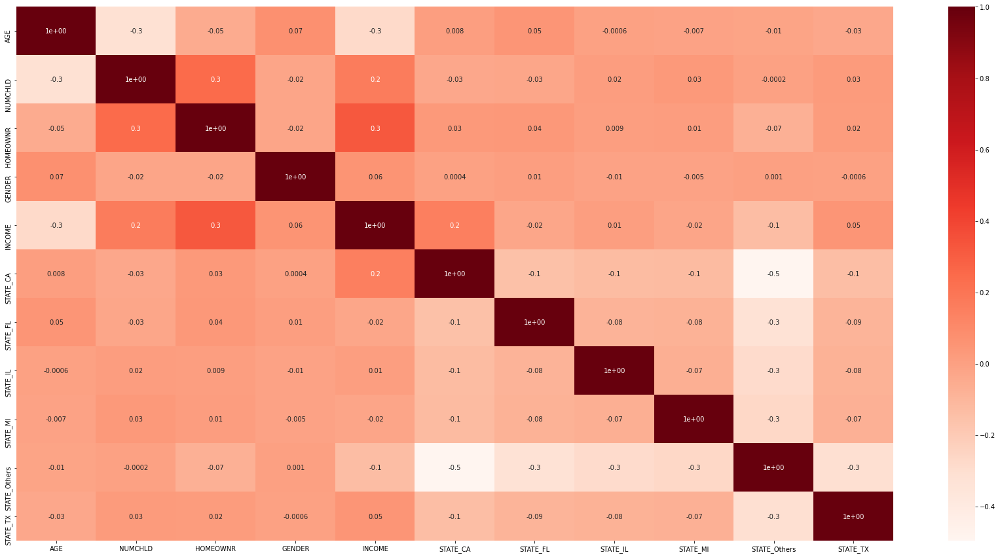

In [54]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(30,15))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = df_dem.corr(method ='spearman')
cor_heatmap(cor_spearman)

In [118]:
#dos state_CA é a unica que pode ser importante?
#gender tambem faria drop

In [126]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestRegressor

def corr_rf(df):
    feature_table = pd.DataFrame(index=df.columns)
    i=0
    for col in df:
        embeded_rf_selector = SelectFromModel(RandomForestRegressor(n_estimators=100), max_features=len(df.columns)-1)
        embeded_rf_selector.fit(df.drop(col,axis=1), df[col])
        embeded_rf_support = embeded_rf_selector.get_support()
        embeded_rf_support = list(embeded_rf_support)
        embeded_rf_support.insert(i,True)
        i+=1

        feature_table[col]=embeded_rf_support
    feature_table['Total'] = np.sum(feature_table, axis=1)
    feature_table = feature_table.sort_values(['Total'] , ascending=False)
    return feature_table

corr_rf(df_dem)

,AGE,NUMCHLD,HOMEOWNR,GENDER,INCOME,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX,Total
STATE_IL,False,False,False,False,False,True,True,True,True,True,True,6
STATE_MI,False,False,False,False,False,True,True,True,True,True,True,6
STATE_TX,False,False,False,False,False,True,True,True,True,True,True,6
AGE,True,True,True,True,True,False,False,False,False,False,False,5
INCOME,True,True,True,True,True,False,False,False,False,False,False,5
STATE_FL,False,False,False,False,False,True,True,True,False,True,True,5
HOMEOWNR,False,True,True,True,True,False,False,False,False,False,False,4
STATE_CA,False,False,False,False,False,True,True,False,False,True,True,4
STATE_Others,False,False,False,False,False,True,True,False,False,True,False,3
NUMCHLD,True,True,False,False,False,False,False,False,False,False,False,2


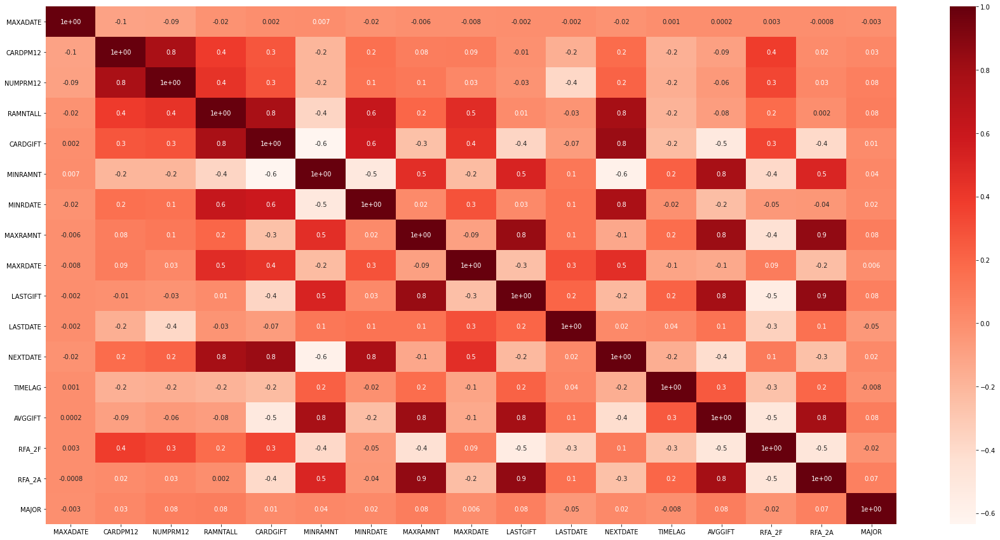

In [56]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(30,15))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = df_sum.corr(method ='spearman')
cor_heatmap(cor_spearman)

In [85]:
df_sum.drop(['MAXADATE', 'MAJOR'], axis=1, inplace=True)  #no correlation

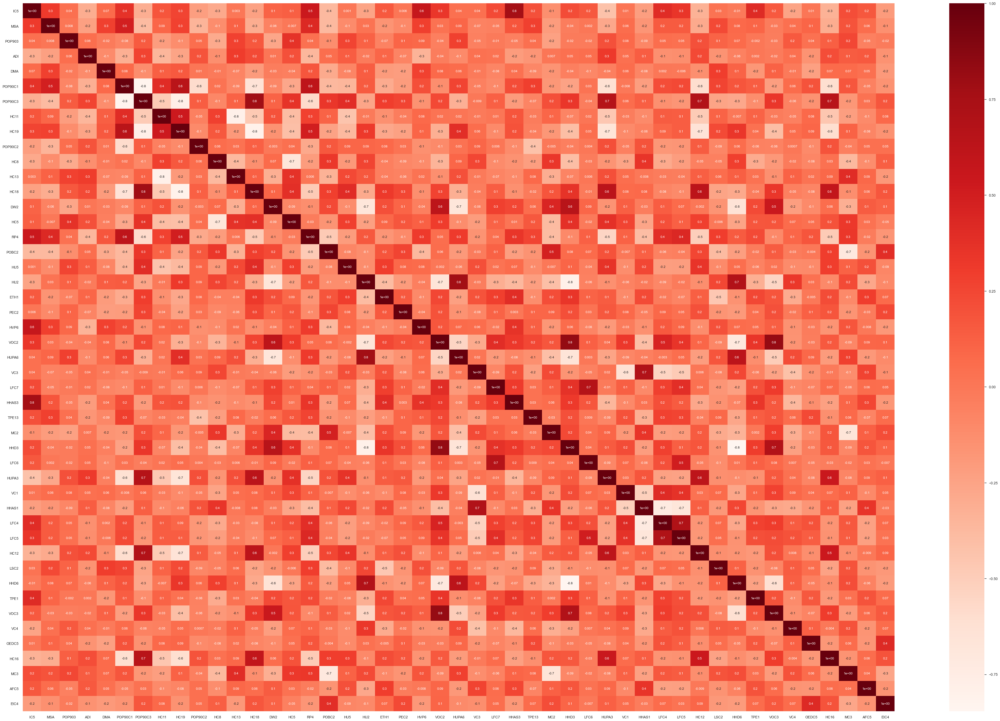

In [179]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(60,40))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = df_cen.corr(method ='spearman')
cor_heatmap(cor_spearman)

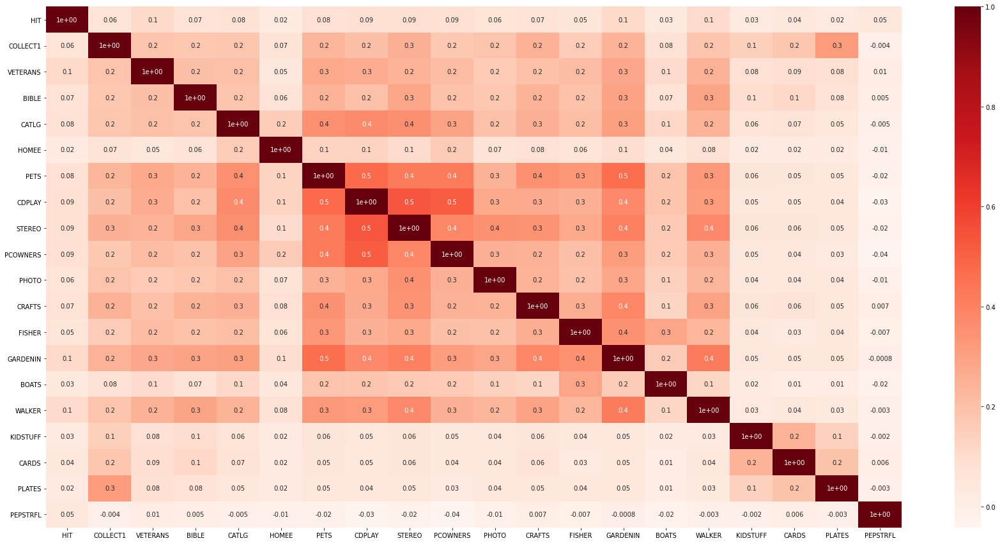

In [58]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(30,15))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = df_int.corr(method ='spearman')
cor_heatmap(cor_spearman)

In [123]:
#PEPSTRFL, HOMEE E HIT FAZER DROP

## PCA for census variables

<a class="anchor" id="pca">

In [86]:
# Use PCA to reduce dimensionality of data
pca = PCA()
pca_feat = pca.fit_transform(df_cen)
pca_feat  

# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,983.578810,0.000000,8.804241e-01,0.880424
2,81.528525,-902.050285,7.297807e-02,0.953402
3,10.998044,-70.530481,9.844604e-03,0.963247
4,7.599980,-3.398064,6.802918e-03,0.970050
5,7.042630,-0.557350,6.304021e-03,0.976354
6,4.445520,-2.597111,3.979288e-03,0.980333
7,2.923379,-1.522141,2.616784e-03,0.982950
8,2.633502,-0.289878,2.357308e-03,0.985307
9,2.356652,-0.276849,2.109494e-03,0.987417
10,1.571101,-0.785552,1.406329e-03,0.988823


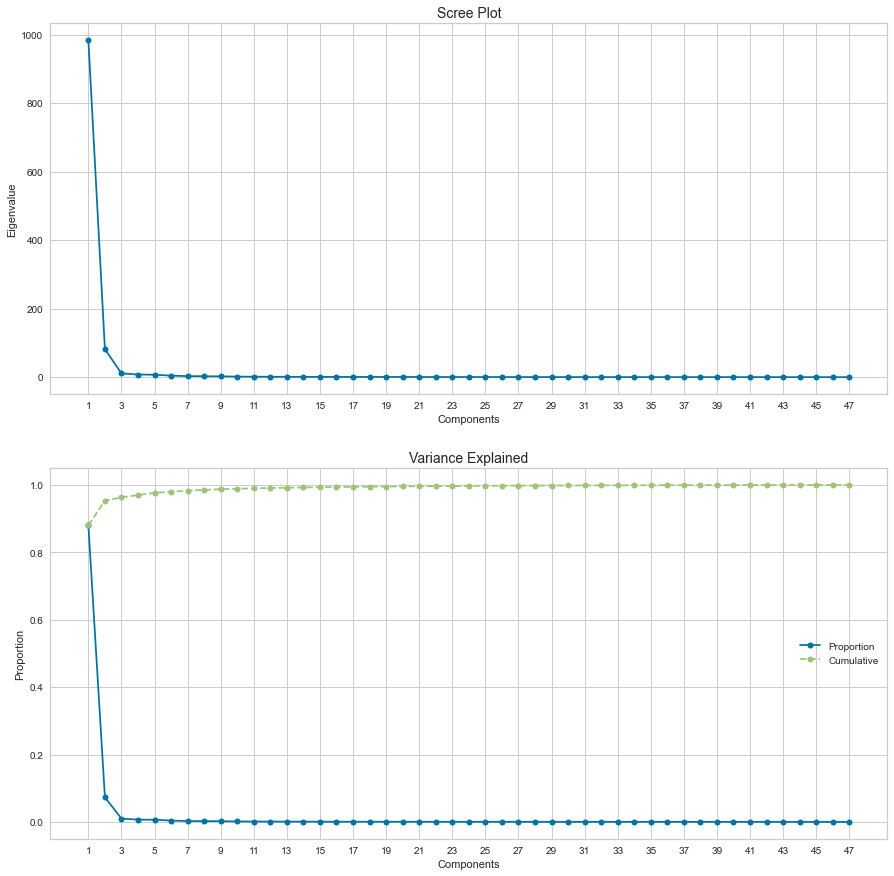

In [87]:
%matplotlib inline
# figure and axes
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 15))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [88]:
pca = PCA(n_components=3)
pca_feat = pca.fit_transform(df_cen)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=df_cen.index, columns=pca_feat_names)  
pca_df

,PC0,PC1,PC2
CONTROLN,,,
95515,21.384046,-2.506507,-0.425284
148535,-15.470471,43.322007,-1.079977
15078,-11.586399,-4.036339,-2.628860
172556,-5.835898,1.273005,4.894727
7112,-13.588365,-3.834575,0.190197
...,...,...,...
184568,-13.597980,-3.459444,2.305215
122706,-13.720228,-1.103977,-0.641687
189641,-13.586617,-3.733123,0.817970


In [91]:
# Reassigning df to contain pca variables
df_pca_cen = pd.concat([df_cen, pca_df], axis=1)  #df_pca1 em vez disto se calhar devia ser df_[numerical_data] - para nao incluir a normalizacao
df_pca_cen.head()

,IC5,MSA,POP903,ADI,DMA,POP90C1,POP90C3,HC11,HC19,POP90C2,HC8,HC13,HC18,DW2,HC5,RP4,POBC2,HU5,HU2,ETH1,PEC2,HVP6,VOC2,HUPA6,VC3,LFC7,HHAS3,TPE13,MC2,HHD3,LFC6,HUPA3,VC1,HHAS1,LFC4,LFC5,HC12,LSC2,HHD6,TPE1,VOC3,VC4,OEDC5,HC16,MC3,AFC5,EIC4,PC0,PC1,PC2
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,-0.124410,-0.615809,-0.324495,0.009346,0.197479,-1.0,1.203704,0.422535,-1.057692,35.0,0.326923,-0.282051,3.555556,0.676471,-0.066667,-0.433333,0.46875,0.1250,-0.40,-0.066667,0.086957,0.0,0.583333,-0.133333,-0.666667,0.15,0.333333,-0.863636,0.05,0.40,-0.235294,0.000000,0.235294,0.117647,-0.5000,-0.6250,-0.285714,1.50,0.181818,0.750000,0.000000,0.583333,0.538462,-0.2,-0.583333,0.666667,1.923077,21.384046,-2.506507,-0.425284
148535,3.039082,0.207721,0.516414,-0.757009,0.705882,0.0,0.000000,0.507042,0.076923,0.0,-0.557692,-0.435897,-0.055556,0.794118,1.333333,0.266667,-0.62500,0.2500,-0.80,-1.733333,-0.391304,47.0,1.208333,-0.133333,-1.000000,0.35,0.958333,0.318182,-0.45,1.30,-0.117647,0.000000,1.470588,-1.176471,0.5625,0.1875,-0.285714,1.25,-0.818182,0.083333,2.428571,-0.750000,-0.153846,-0.2,-0.083333,-1.333333,-0.230769,-15.470471,43.322007,-1.079977
15078,-0.301925,-0.615809,2.626263,0.495327,-0.491597,-1.0,1.814815,-0.845070,-1.500000,2.0,0.038462,0.358974,4.222222,-0.088235,0.233333,-1.400000,0.78125,0.8125,-0.08,0.200000,0.434783,0.0,0.083333,0.066667,0.000000,0.60,-0.500000,-0.136364,0.45,0.15,0.705882,1.846154,-0.117647,0.117647,-0.1250,0.1250,0.571429,0.25,0.000000,-0.416667,0.714286,-0.083333,0.230769,2.8,-0.166667,-0.833333,1.307692,-11.586399,-4.036339,-2.628860
172556,0.180775,1.101103,-0.467172,-0.504673,0.953782,-1.0,1.703704,-0.211268,-1.403846,8.0,0.500000,-0.102564,4.222222,0.323529,0.100000,-1.733333,0.25000,0.0625,1.12,-2.133333,0.260870,5.0,-0.833333,-0.133333,-0.047619,-0.95,-0.708333,-0.954545,0.05,-0.05,-1.941176,0.692308,-0.941176,-0.235294,-0.2500,-0.5625,2.857143,9.75,0.181818,-1.750000,0.571429,0.583333,1.230769,3.0,-0.583333,-0.666667,-1.000000,-5.835898,1.273005,4.894727
7112,-0.538250,0.303309,0.217172,-0.224299,-0.449580,0.0,0.000000,-0.718310,-1.423077,0.0,0.730769,1.307692,0.000000,0.764706,-0.433333,-0.100000,0.18750,-0.3125,-0.56,-6.066667,-0.434783,0.0,-0.750000,-0.133333,1.000000,-0.95,-1.333333,0.545455,1.35,-0.65,0.823529,0.000000,-1.235294,0.529412,-0.4375,-0.3125,1.714286,-0.50,-0.545455,-0.500000,-0.071429,0.916667,-1.692308,-0.2,-0.500000,-0.250000,-1.153846,-13.588365,-3.834575,0.190197


In [93]:
metric_features = df_cen.columns.tolist()

def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_pca_cen.corr().loc[metric_features, pca_feat_names]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2
IC5,-0.167874,0.636681,-0.097652
MSA,-0.282618,0.201238,0.231075
POP903,0.0142678,0.0272705,0.166044
ADI,0.163019,-0.290502,-0.136647
DMA,0.00919036,0.302651,0.152268
POP90C1,-0.544702,0.164655,0.452896
POP90C3,-0.134021,-0.202955,-0.535195
HC11,0.0396146,0.185591,0.298356
HC19,0.0884149,0.18784,0.535954
POP90C2,0.999936,0.0113204,9.51122e-05


In [92]:
df_pca_cen[pca_feat_names]

,PC0,PC1,PC2,PC3,PC4,PC5,PC6
CONTROLN,,,,,,,
95515,21.585234,-2.703147,5.038282,-4.377708,-1.924761,-3.830479,-3.059331
148535,-15.826830,44.605696,-3.076156,-0.478463,3.079282,-0.972440,-6.656588
15078,-11.444493,-5.243520,1.538624,-4.376548,4.826944,-2.115323,-1.442666
172556,-5.765355,0.713890,1.355886,5.001667,8.689212,-1.558890,-5.764309
7112,-13.535902,-4.366837,-1.510916,2.243873,0.826352,-0.551683,-1.502717
...,...,...,...,...,...,...,...
184568,-13.603981,-3.348449,-1.407023,3.249215,-0.033087,0.730918,1.335966
122706,-13.869745,-0.506768,-2.873658,-2.230939,-1.895620,2.122300,-3.627180
189641,-13.528927,-4.284724,-1.480399,2.549503,-1.338036,0.466212,-1.616422


In [66]:
df_pca_cen[metric_features]

,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,-0.324905,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.0,-0.5,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.676471,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.124843,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25
148535,0.517067,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,0.0,1.5,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.794118,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.039294,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.428571,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25
15078,2.629583,-1.000000,2.0,1.814815,0.000000,0.200000,0.0,0.0,0.0,-0.5,0.166667,0.666667,0.2,-0.250,-0.142857,0.50,0.2,-0.166667,-0.666667,-0.50,0.50,1.00,0.285714,-0.333333,-0.2,0.4,-0.250,-0.088235,0.000000,3.0,3.0,0.0,-0.08,0.125,0.8125,0.15,0.000000,1.0,0.0,-0.142857,-0.25,0.0,0.4,-0.3,0.0,1.0,1.846154,0.111111,0.000000,0.066667,3.0,-1.400000,-0.615809,0.495327,-0.491597,-0.302394,0.117647,0.666667,-0.500000,0.272727,0.45,-0.166667,-0.416667,1.250,0.0,-0.25,0.000000,0.0,0.434783,0.000000,0.4,-0.136364,-0.1250,0.1250,0.705882,0.60,0.000000,-0.3,-0.666667,-0.333333,-1.000000,-0.428571,0.0,0.0

In [ ]:
# Do this after checking the new pandas profiling report
#df_pca2.drop(columns=['PC11], inplace=True)

## Clustering

### Testing on K-means and Hierarchical clustering

<a class="anchor" id="hier">

In [94]:
def kelbowplots(clus_estim, data):
    """
    This function produces the k-elbow plot for a given clustering estimator according to 2 different clustering quality measures: "Distortion" and "Calinski Harabasz".
    """
    sns.set()
    fig, axes = plt.subplots(1, 2, figsize=(20,7))

    # Plot the data
    metrics = ["distortion", "calinski_harabasz"]
    ylabels = ["Distortion measure", "Calinski Harabasz measure"]
    titles = ["Distortion measure plot", "Calinski Harabasz measure plot"]
    for ax, m, yl, tl in zip(axes.flatten(), metrics, ylabels, titles):
        # KElbowVisualizer produces the elbow plot for several quality measures
        KElbowVisualizer(clus_estim, metric=m, timings=False, locate_elbow=False, ax=ax).fit(data)
        ax.invert_xaxis()
        ax.set_ylabel(yl, fontsize=13)
        ax.set_xlabel("Number of clusters", fontsize=13)
        ax.set_title(tl, fontsize=13)

    # Set figure
    plt.suptitle("K-Elbow Plots", fontsize=23)

    plt.show()

In [95]:
#K means Clustering 
def clus_Kmeans(df, nclust):
    model = KMeans(nclust, random_state=0)
    model.fit(df)
    clust_labels = model.predict(df)
    cent = model.cluster_centers_
    return (clust_labels, cent)

In [96]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst
    
def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust


# Set up the clusterers
kmeans = KMeans(
    init='k-means++',
    n_init=20,
    random_state=42
)

hierarchical = AgglomerativeClustering(
    affinity='euclidean'
)

In [97]:
def get_ss_variables(df):
    """Get the SS for each variable
    """
    ss_vars = df.var() * (df.count() - 1)
    return ss_vars

def r2_variables(df, labels):
    """Get the R² for each variable
    """
    sst_vars = get_ss_variables(df)
    ssw_vars = np.sum(df.groupby(labels).apply(get_ss_variables))
    return 1 - ssw_vars/sst_vars

In [98]:
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
    The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    def get_ss(df):
        ss = np.sum(df.var() * (df.count() - 1))
        return ss  # return sum of sum of squares of each df variable
    
    sst = get_ss(df)  # get total sum of squares
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        hclabels = cluster.fit_predict(df) #get cluster labels
        df_concat = pd.concat((df, pd.Series(hclabels, name='labels')), axis=1)  # concat df with labels
        ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
        ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
        r2.append(ssb / sst)  # save the R2 of the given cluster solution
        
    return np.array(r2)

In [99]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(s=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()


### Sample of the dataframe

https://datascience.stackexchange.com/questions/47889/how-to-run-agglomerativeclustering-on-a-big-data-in-python

In [100]:
df_sample = df_.sample(n=20000)
df_dem_sample = df_dem.sample(n=20000)
df_sum_sample = df_sum.sample(n=20000)
df_cen_sample = df_cen.sample(n=20000)
df_int_sample = df_int.sample(n=20000)

df_pca_sample = df_pca_cen[pca_feat_names].sample(n=20000)

#we've runned this cell and the ones below 4x times we got the same final results

### Finding the optimal clusterer on demographic variables

<a class="anchor" id="r2">

In [27]:
# Obtaining the R² scores for each cluster solution on demographic variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_dem_sample, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:  #hierarchical
    r2_scores[linkage] = get_r2_scores(
        df_dem_sample, hierarchical.set_params(linkage=linkage)
    )
    
pd.DataFrame(r2_scores)

,kmeans,complete,average,single,ward
2,0.202697,0.072274,0.005792,0.000472,0.156796
3,0.295097,0.196898,0.013458,0.000662,0.240864
4,0.354034,0.232953,0.118949,0.001103,0.290611
5,0.412662,0.305598,0.120372,0.001324,0.334849
6,0.445879,0.316283,0.123550,0.002172,0.377834
7,0.478585,0.319724,0.123799,0.036805,0.405716
8,0.505000,0.332776,0.124137,0.119717,0.430219
9,0.525625,0.341654,0.155448,0.164887,0.448440
10,0.543417,0.370777,0.155714,0.202472,0.465543
11,0.557307,0.374873,0.168259,0.239312,0.481603


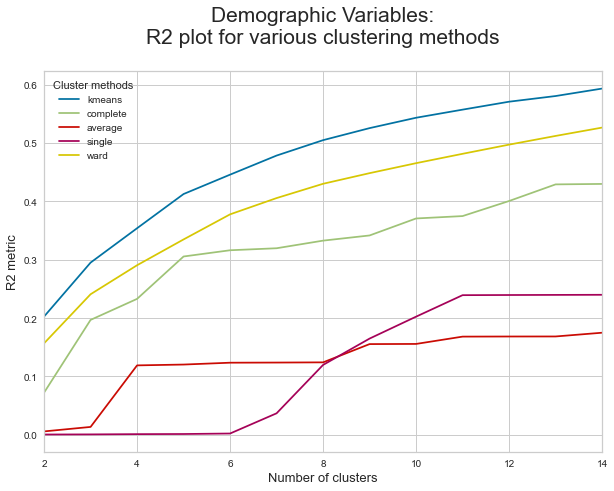

In [28]:
# Visualizing the R² scores for each cluster solution on demographic variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Demographic Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

#kmeans seems to be the best option, 5 clusters

### Repeat the process for summary variables

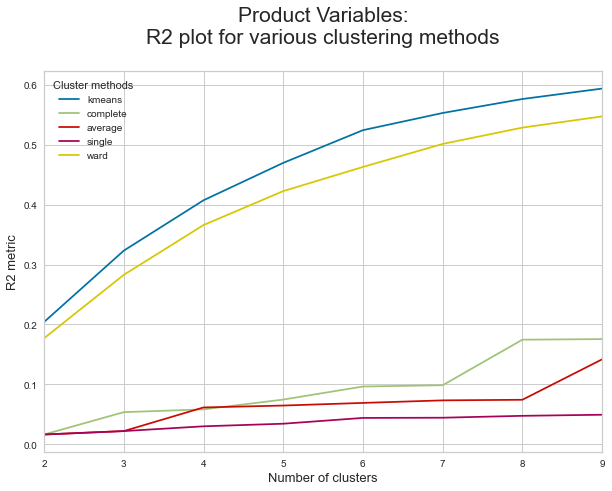

In [32]:
# Obtaining the R² scores for each cluster solution on product variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_sum_sample, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_sum_sample, hierarchical.set_params(linkage=linkage)
    )

# Visualizing the R² scores for each cluster solution on product variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Summary Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

# clusters, kmeans, elbow


#6

### Repeat the process for census variables

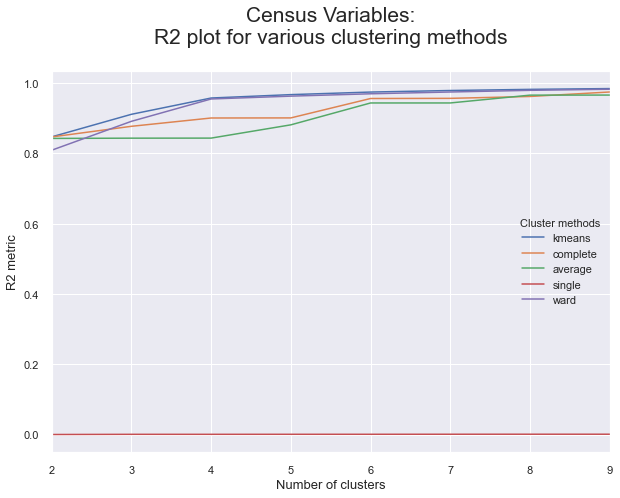

In [187]:
# Obtaining the R² scores for each cluster solution on product variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_pca_sample, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_pca_sample, hierarchical.set_params(linkage=linkage)
    )

# Visualizing the R² scores for each cluster solution on product variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Census Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

# clusters, kmeans, elbow

#4 

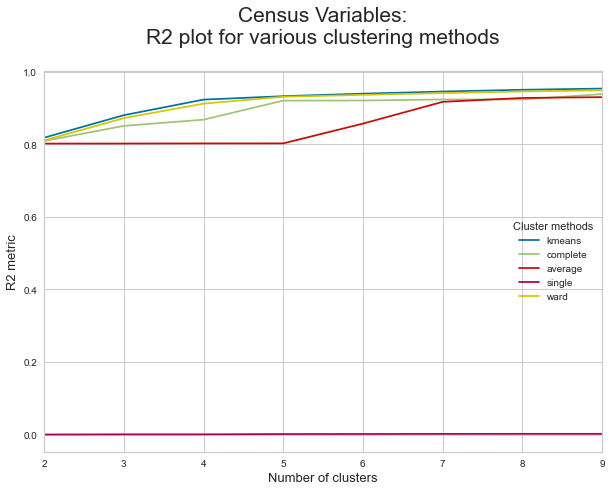

In [101]:
# Obtaining the R² scores for each cluster solution on product variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_cen_sample, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_cen_sample, hierarchical.set_params(linkage=linkage)
    )

# Visualizing the R² scores for each cluster solution on product variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Census Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

# clusters, kmeans, elbow

### Repeat the process for interest variables

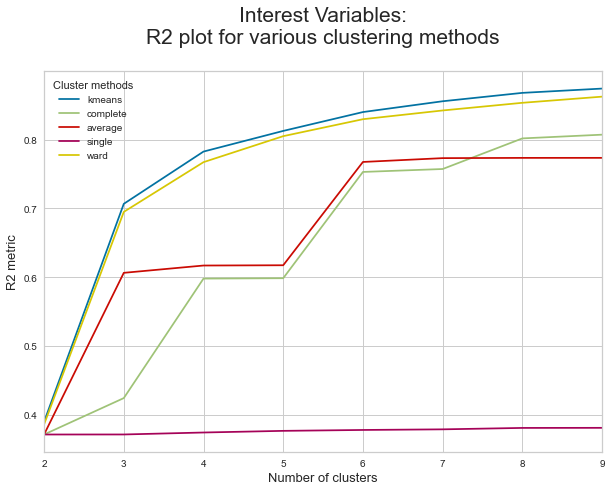

In [34]:
# Obtaining the R² scores for each cluster solution on product variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_int_sample, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_int_sample, hierarchical.set_params(linkage=linkage)
    )

# Visualizing the R² scores for each cluster solution on product variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Interest Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

# clusters, kmeans, elbow

### Defining the linkage method to choose

In [25]:
# Prepare input
hc_methods = ["ward", "complete", "average", "single"]
# Call function defined above to obtain the R2 statistic for each hc_method
max_nclus = 5
r2_hc_methods = np.vstack([get_r2_hc(df=df_dem, link_method=link, max_nclus=max_nclus) for link in hc_methods]).T
r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

sns.set()
# Plot data
fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

# Finalize the plot
fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
plt.gca().invert_xaxis()  # invert x axis
plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

plt.show()

MemoryError: Unable to allocate 31.9 GiB for an array with shape (4277708760,) and data type float64

## Demograghic segmentation

### Defining the number of clusters:


In [104]:
range_clusters = range(1, 11)

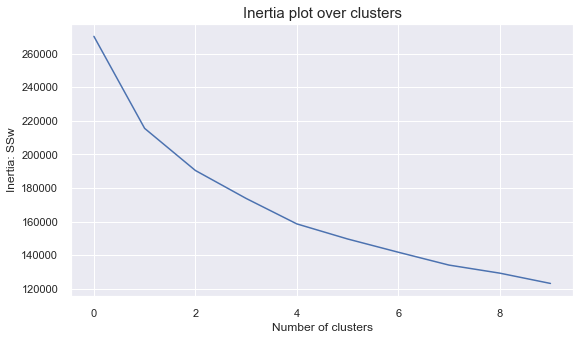

In [46]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_dem)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

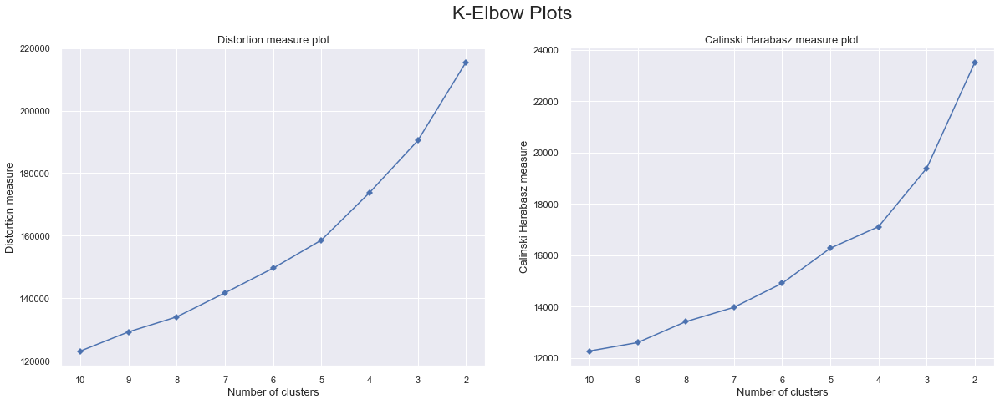

In [47]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_dem)

For n_clusters = 2, the average silhouette_score is : 0.20129546303367435
For n_clusters = 3, the average silhouette_score is : 0.17201687296439427
For n_clusters = 4, the average silhouette_score is : 0.18074407860927066
For n_clusters = 5, the average silhouette_score is : 0.16768609008259142
For n_clusters = 6, the average silhouette_score is : 0.1647585062311723
For n_clusters = 7, the average silhouette_score is : 0.1627893662269873
For n_clusters = 8, the average silhouette_score is : 0.1566918094270299
For n_clusters = 9, the average silhouette_score is : 0.1604623174023013
For n_clusters = 10, the average silhouette_score is : 0.16881692878567212


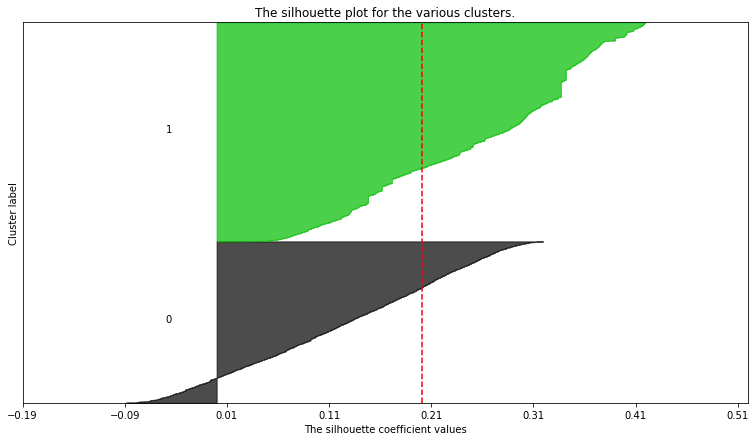

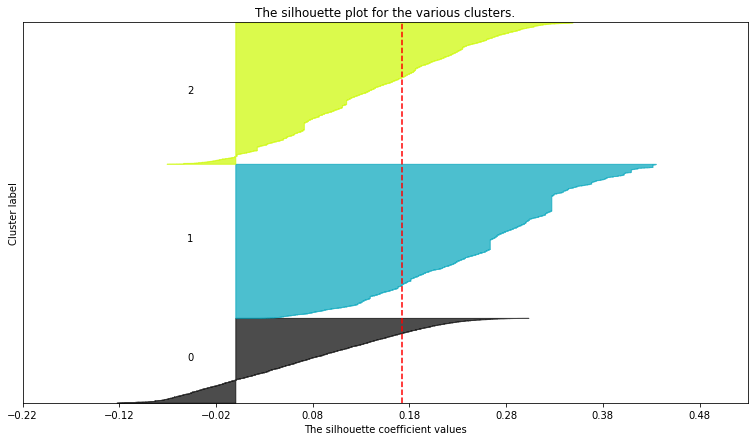

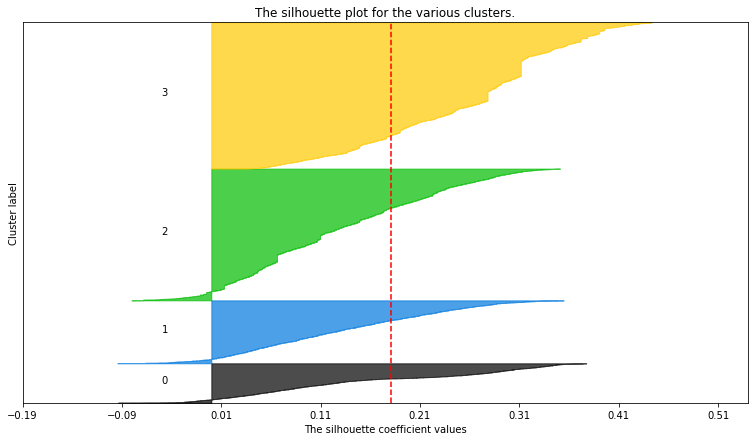

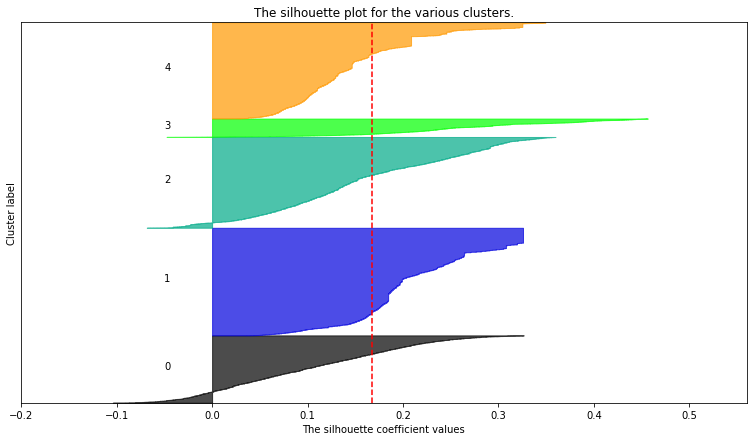

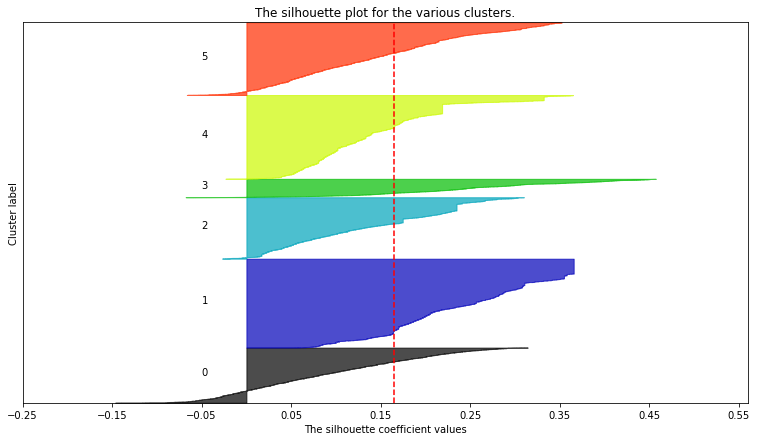

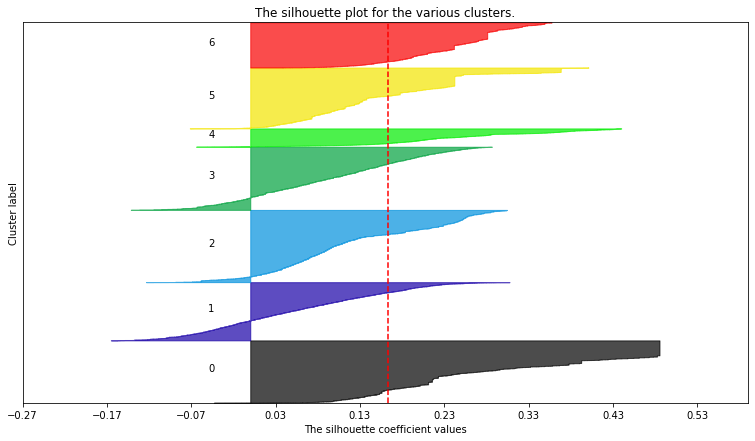

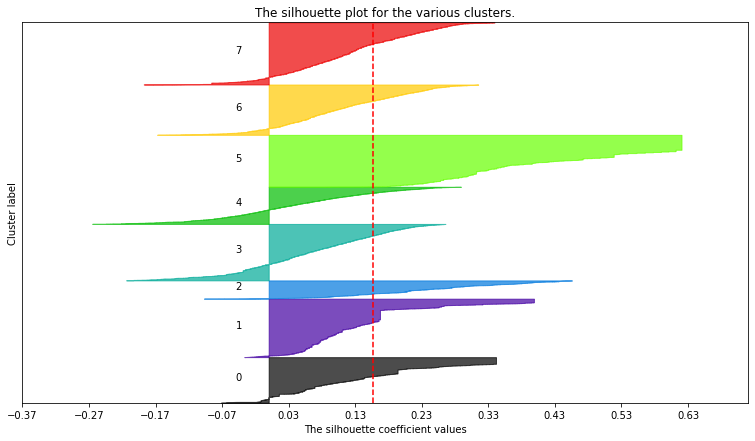

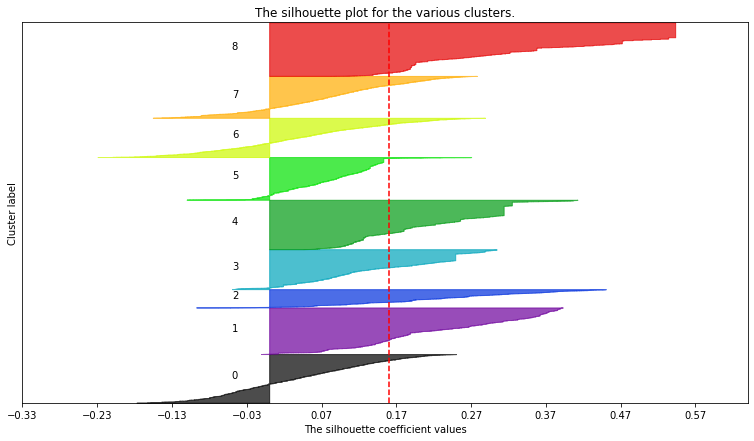

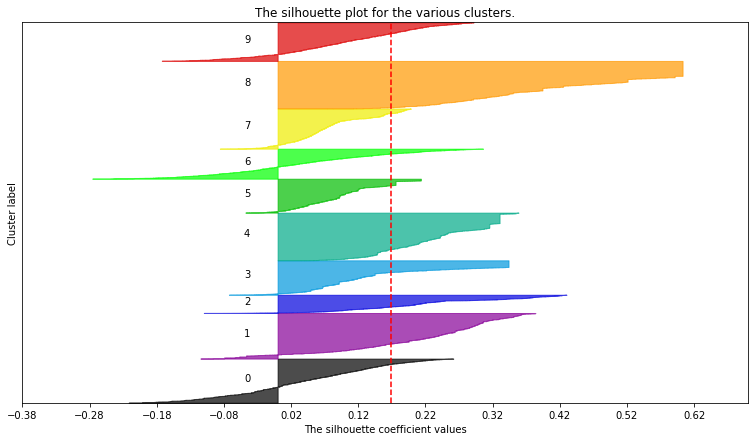

In [34]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_dem)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_dem, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_dem, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_dem) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

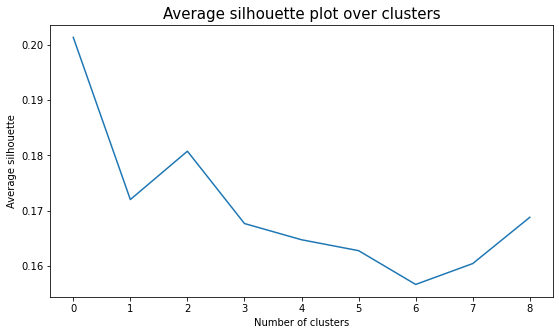

In [35]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

From the graphs above, the optimal number of clusters for the demographic segmentation is 4. However, we have negative silhouette samples and for this reason, the clustering approach can be improved.

In [115]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_dem, 4)
kmeans_dem_df = df_dem.copy()
kmeans_dem_df["kmeans_dem_labels"] = clust_labels

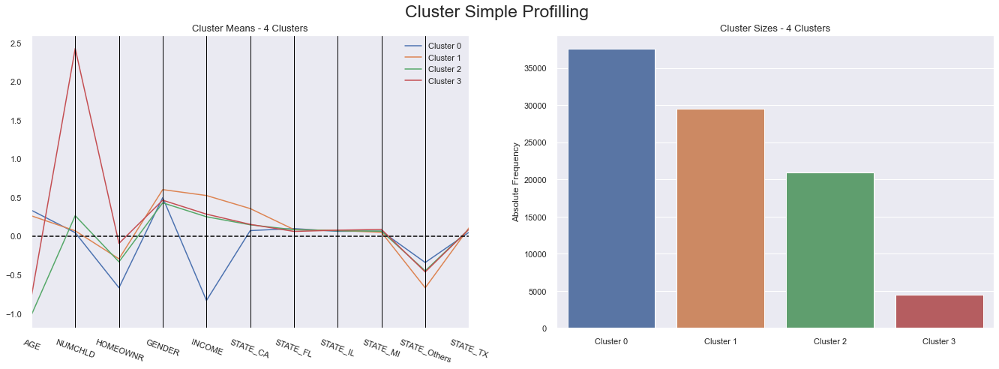

In [117]:
cluster_profiles(kmeans_dem_df, ["kmeans_dem_labels"], figsize=(23, 7))

In [121]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_dem_df, ['kmeans_dem_labels']).drop('kmeans_dem_labels').sort_values()

STATE_FL        0.000286
STATE_MI        0.000596
STATE_IL        0.000825
STATE_TX        0.002612
STATE_CA        0.016425
STATE_Others    0.016585
HOMEOWNR        0.213742
NUMCHLD         0.310288
AGE             0.459168
GENDER          0.552918
INCOME          0.566467
dtype: float64

With this cluster we were able to see the most important variables for demographic segmentation. We will only keep the variables that have an R2 score above 0.3. In the chapter "Clustering with the most important features" we will keep our exploration.

In [123]:
demg = r2_variables(kmeans_dem_df, ['kmeans_dem_labels']).drop('kmeans_dem_labels').sort_values().tail(3).index.to_list()

## Summary segmentation

In [ ]:
#all the states are unnecessary - it doesn't have any representation in the cluster

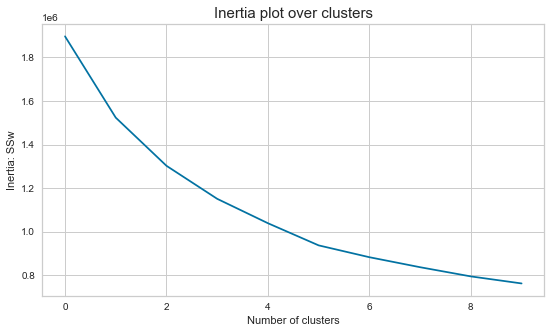

In [105]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_sum)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

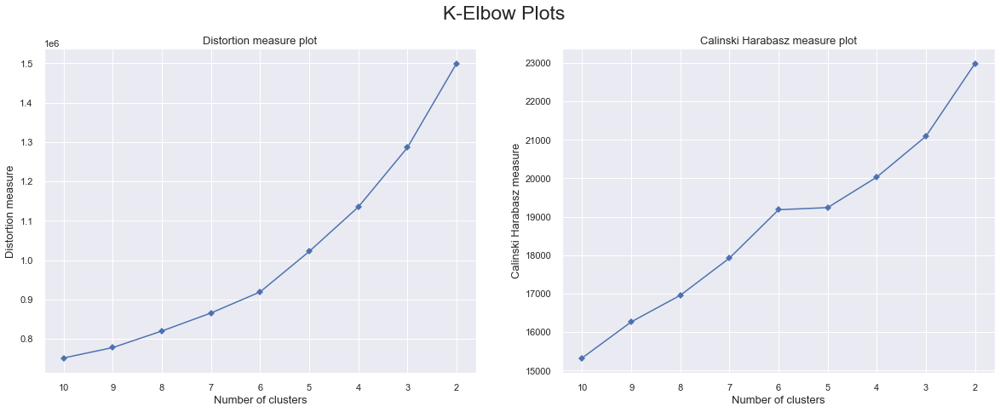

In [61]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_sum)

For n_clusters = 2, the average silhouette_score is : 0.5631449866737094
For n_clusters = 3, the average silhouette_score is : 0.1890775479818658
For n_clusters = 4, the average silhouette_score is : 0.1934951796211452
For n_clusters = 5, the average silhouette_score is : 0.20355658647132804
For n_clusters = 6, the average silhouette_score is : 0.2163977710630714
For n_clusters = 7, the average silhouette_score is : 0.18813082197172554
For n_clusters = 8, the average silhouette_score is : 0.18844649579965017
For n_clusters = 9, the average silhouette_score is : 0.18914937047664637
For n_clusters = 10, the average silhouette_score is : 0.1912381502746513


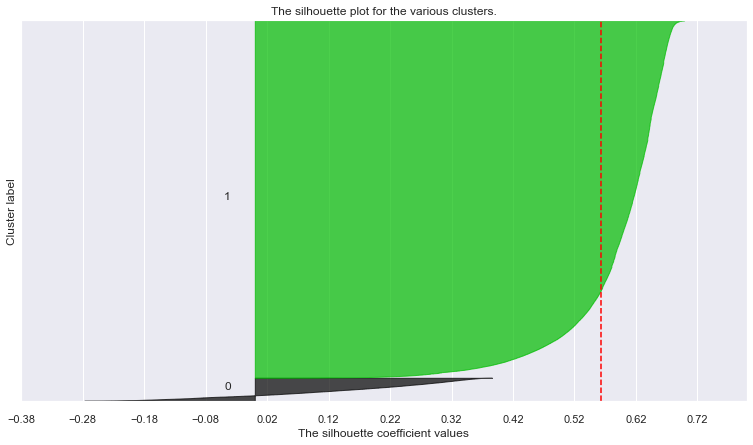

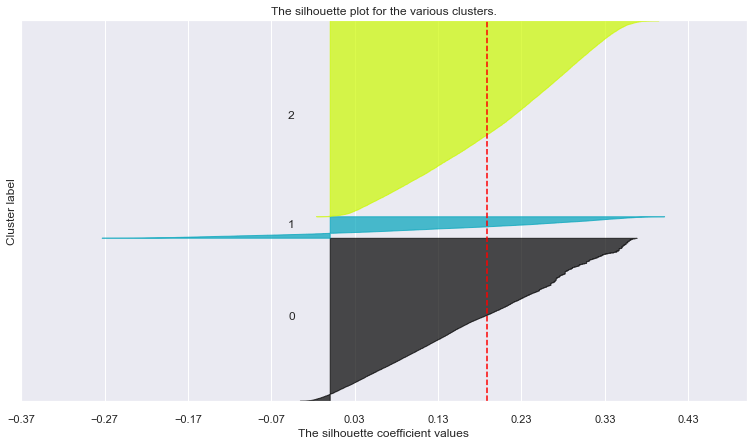

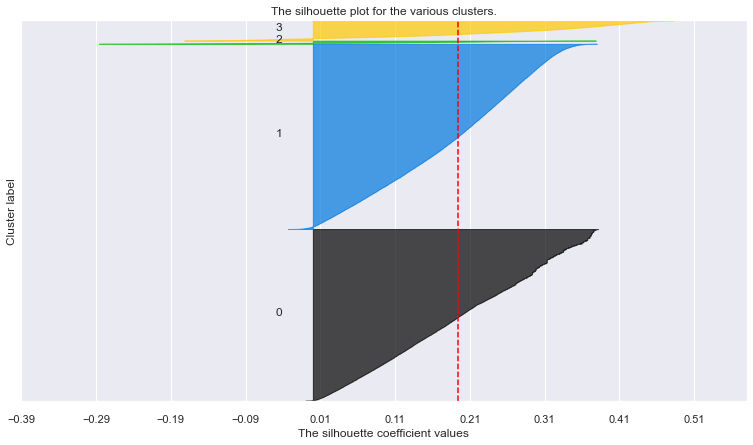

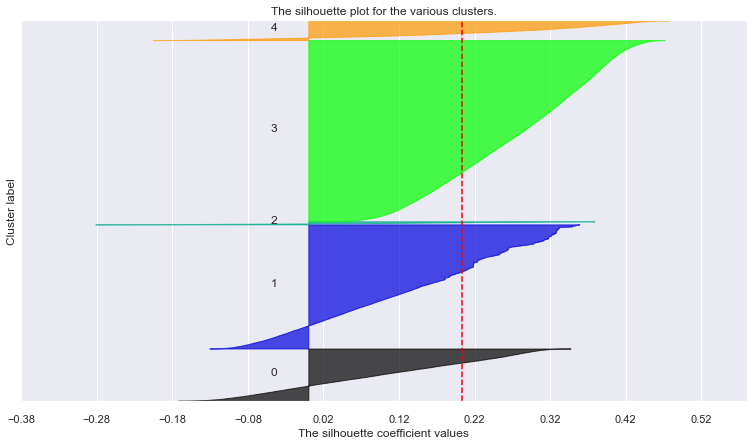

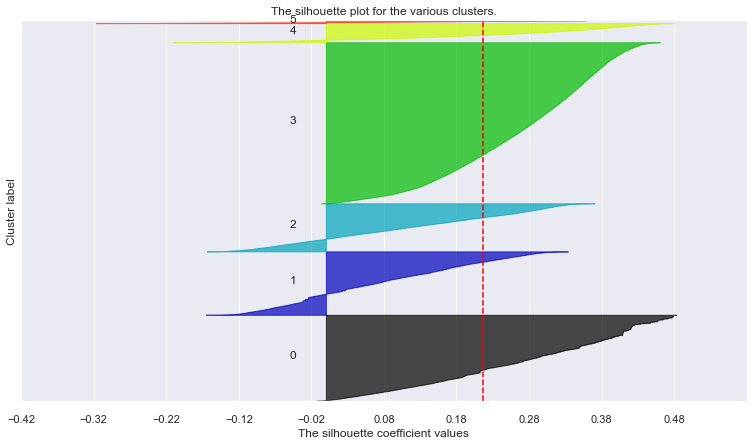

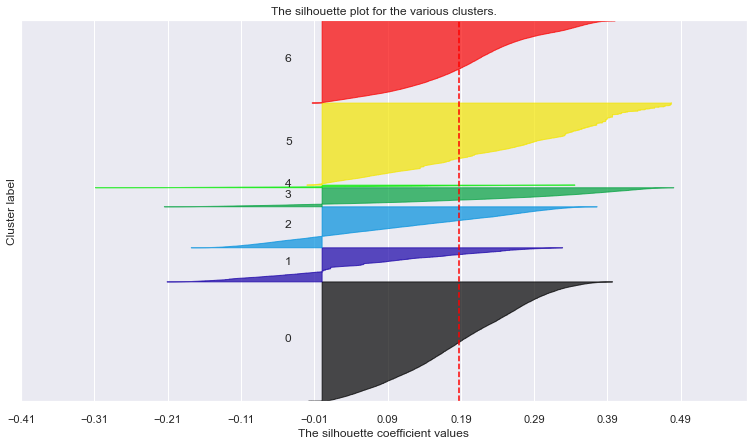

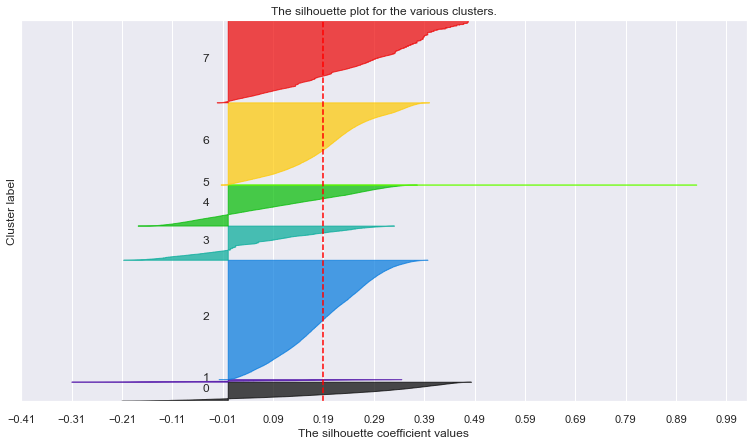

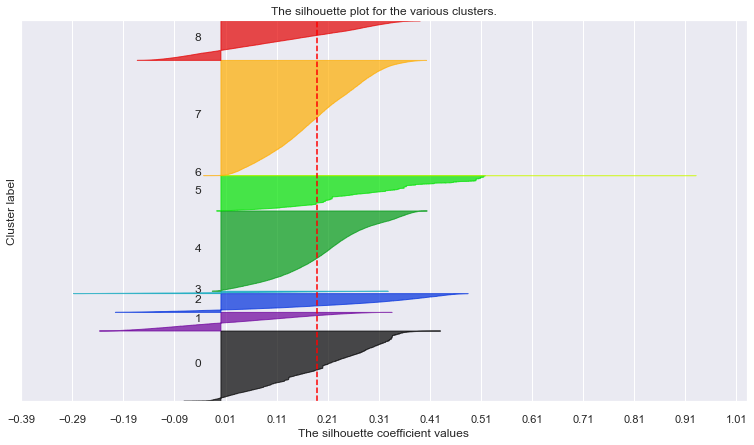

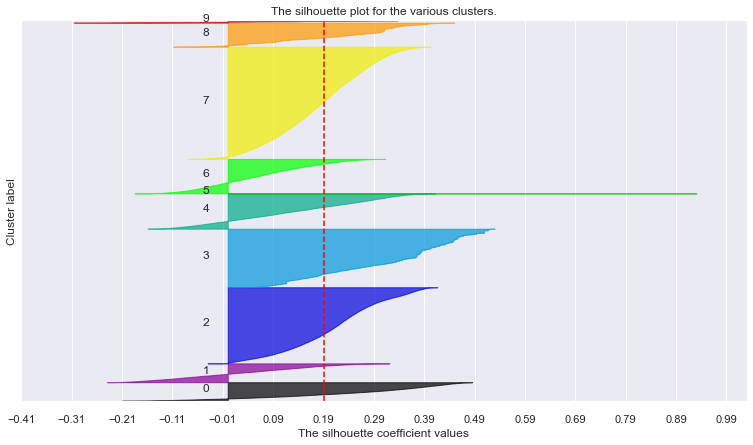

In [82]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_sum)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_sum, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_sum, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_sum) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

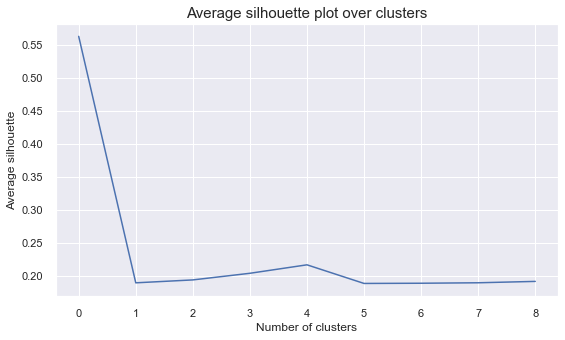

In [83]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

From the graphs above, the optimal number of clusters for the demographic segmentation is 5. However, we have negative silhouette samples and for this reason, the clustering approach can be improved.

In [173]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_sum, 5)
kmeans_sum_df = df_sum.copy()
kmeans_sum_df["kmeans_sum_labels"] = clust_labels

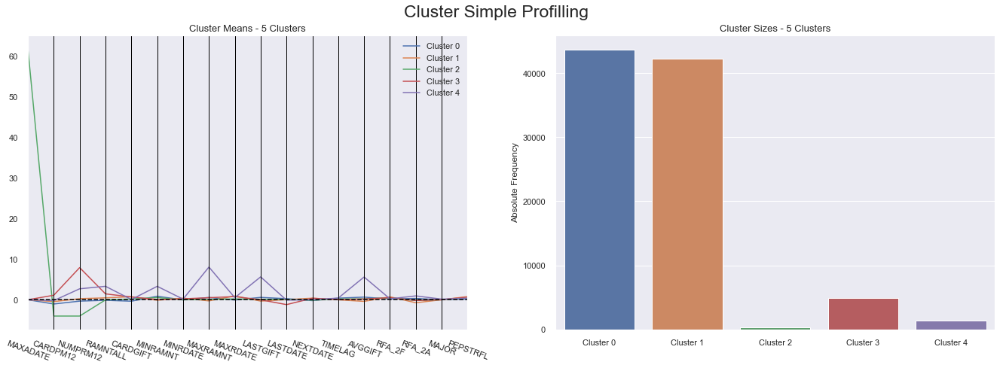

In [174]:
cluster_profiles(kmeans_sum_df, ["kmeans_sum_labels"], figsize=(23, 7))

In [ ]:
#nextdate
#RFA_2F

In [175]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_sum_df, ['kmeans_sum_labels']).drop('kmeans_sum_labels').sort_values()

TIMELAG     0.032787
MINRDATE    0.114766
MAXRDATE    0.130282
MAJOR       0.139464
LASTDATE    0.168615
CARDPM12    0.200839
RAMNTALL    0.230318
RFA_2F      0.247529
NEXTDATE    0.290876
MINRAMNT    0.326647
CARDGIFT    0.359848
PEPSTRFL    0.374534
RFA_2A      0.395485
MAXRAMNT    0.467785
LASTGIFT    0.478135
AVGGIFT     0.513997
NUMPRM12    0.679043
MAXADATE    0.996387
dtype: float64

With this cluster we were able to see the most important variables for summary segmentation. We will only keep the variables that have an R2 score above 0.30. In the chapter "Clustering with the most important features" we will proceed our exploration.

In [176]:
summ = r2_variables(kmeans_sum_df, ['kmeans_sum_labels']).drop('kmeans_sum_labels').sort_values().tail(9).index.to_list()

## Census segmentation

### PCA

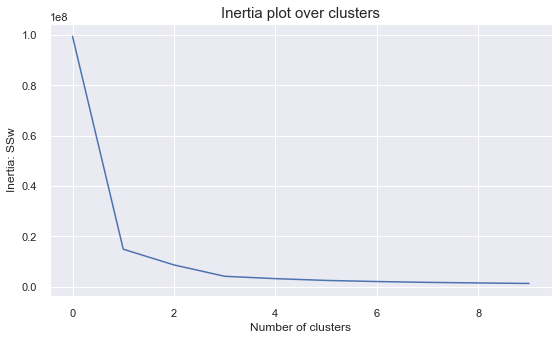

In [188]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_pca_cen[pca_feat_names])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

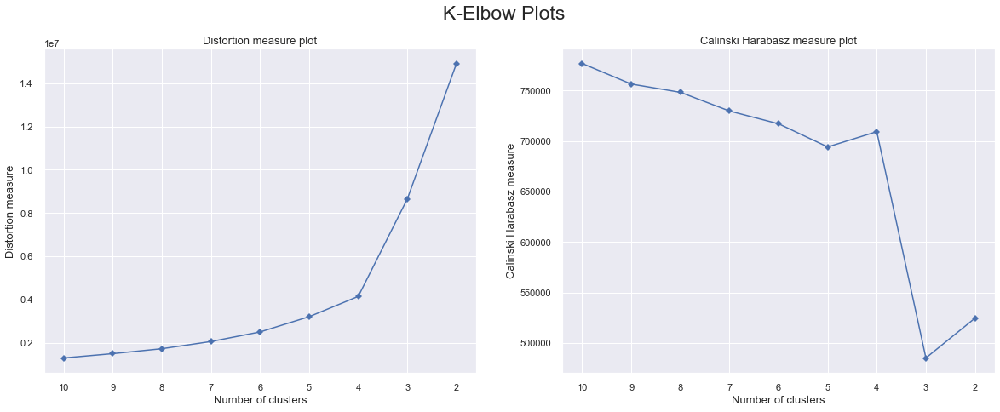

In [189]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_pca_cen[pca_feat_names])

For n_clusters = 2, the average silhouette_score is : 0.7859355502648512
For n_clusters = 3, the average silhouette_score is : 0.6322754479492814
For n_clusters = 4, the average silhouette_score is : 0.6330704551869687
For n_clusters = 5, the average silhouette_score is : 0.641767003193882
For n_clusters = 6, the average silhouette_score is : 0.38144905441153804
For n_clusters = 7, the average silhouette_score is : 0.3889382433575379
For n_clusters = 8, the average silhouette_score is : 0.37968865996667145
For n_clusters = 9, the average silhouette_score is : 0.3266627404213214
For n_clusters = 10, the average silhouette_score is : 0.3339315379726648


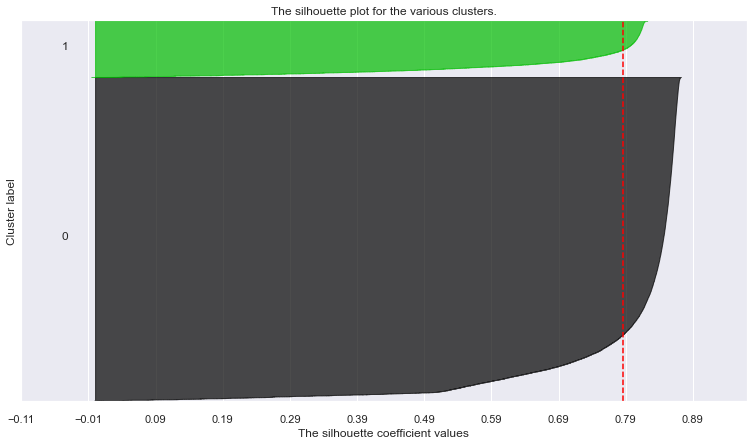

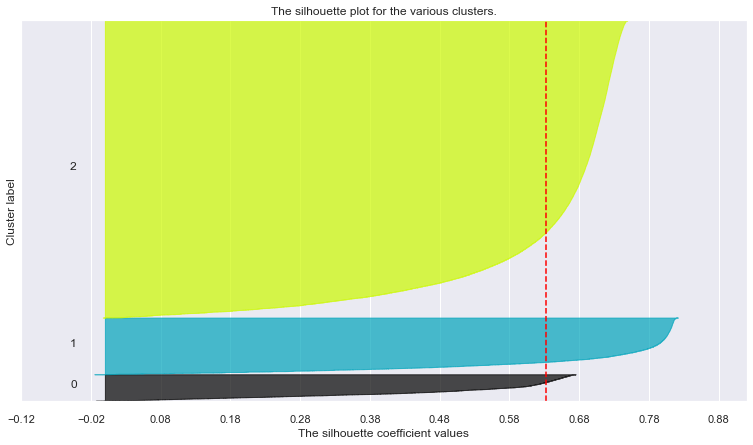

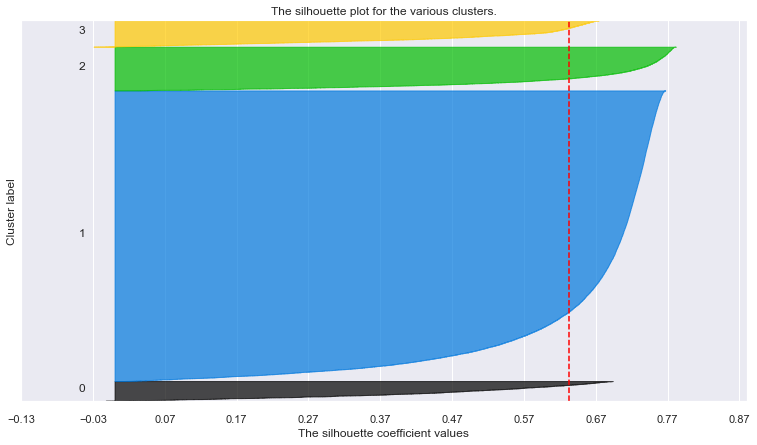

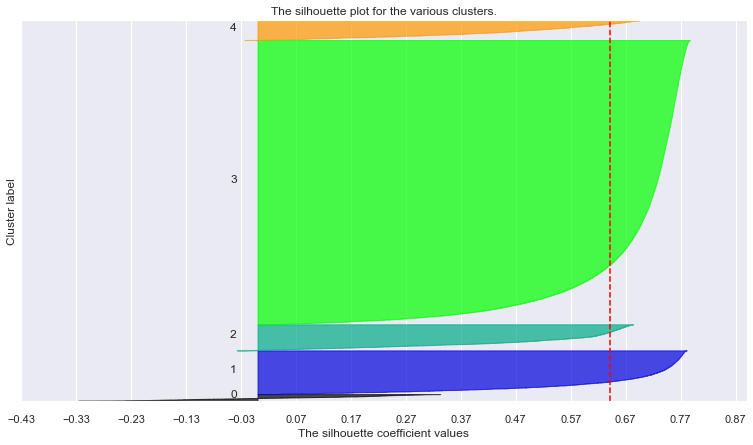

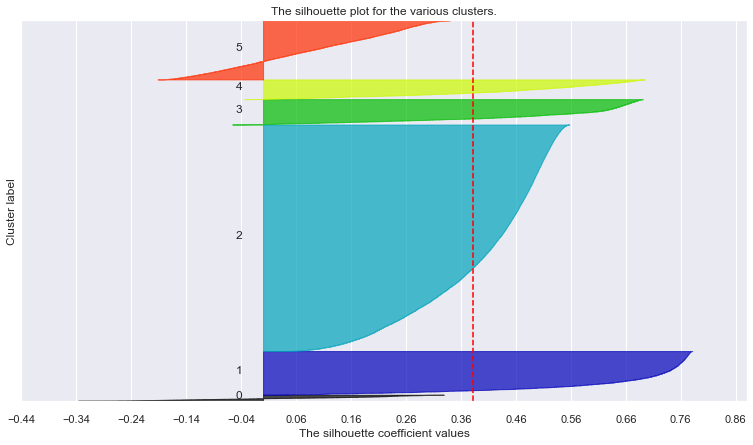

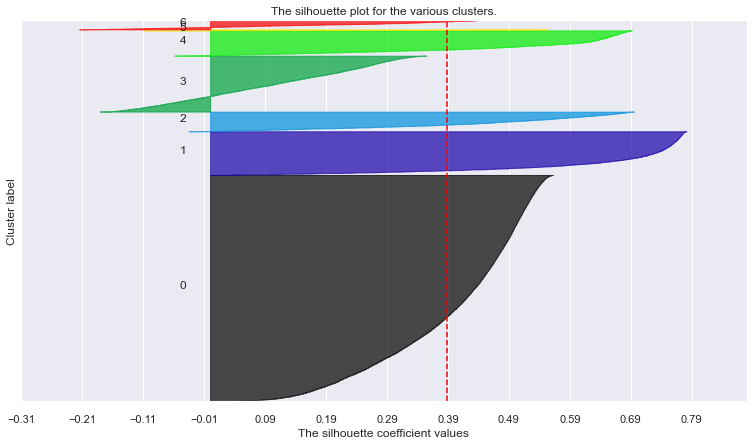

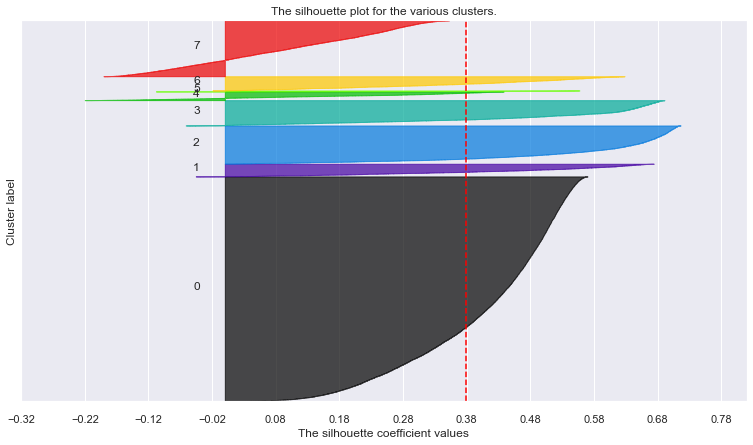

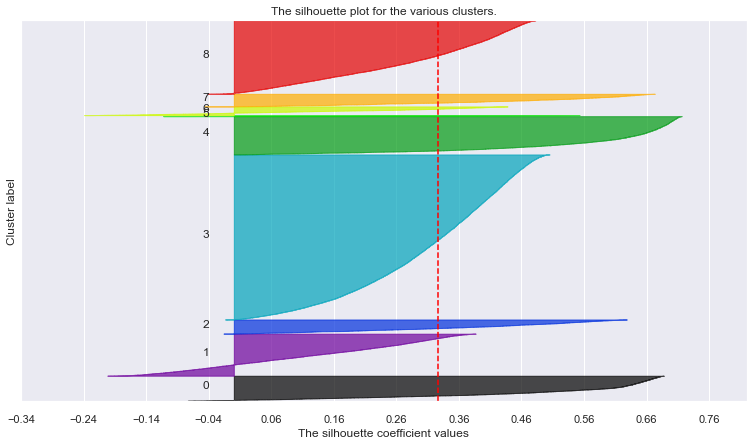

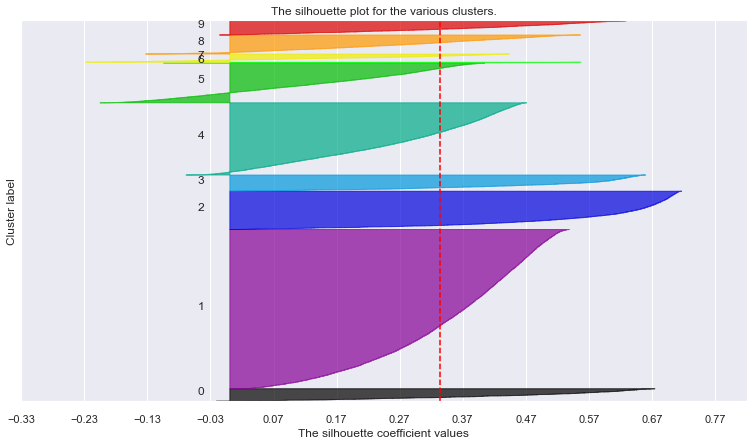

In [97]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_pca_cen[pca_feat_names])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_pca_cen[pca_feat_names], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_pca_cen[pca_feat_names], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_pca_cen[pca_feat_names]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

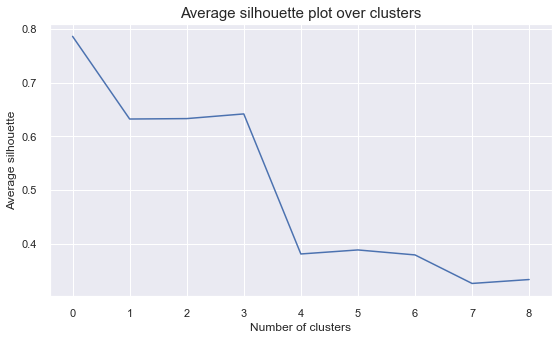

In [98]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

In [190]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_pca_cen[pca_feat_names], 4)
kmeans_cen_df = df_pca_cen[pca_feat_names].copy()
kmeans_cen_df["kmeans_cen_labels"] = clust_labels

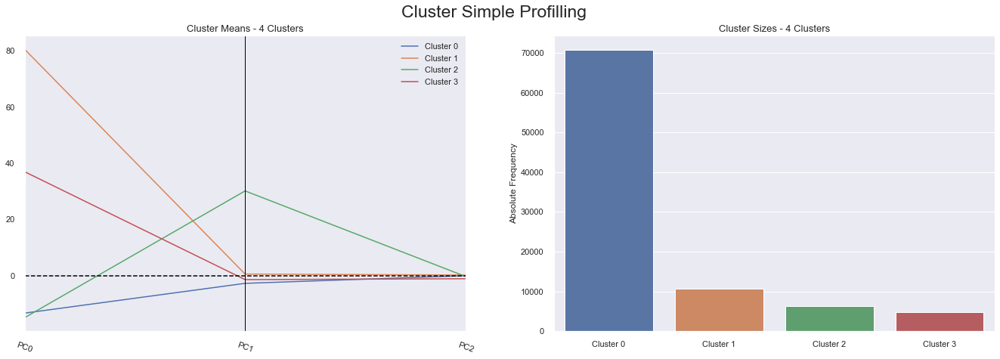

In [191]:
cluster_profiles(kmeans_cen_df, ["kmeans_cen_labels"], figsize=(23, 7))

In [ ]:
#only PC0 AND PC1 worth keepin

In [192]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_cen_df, ['kmeans_cen_labels']).drop('kmeans_cen_labels').sort_values()

PC2    0.006333
PC1    0.825495
PC0    0.979967
dtype: float64

### Census variables

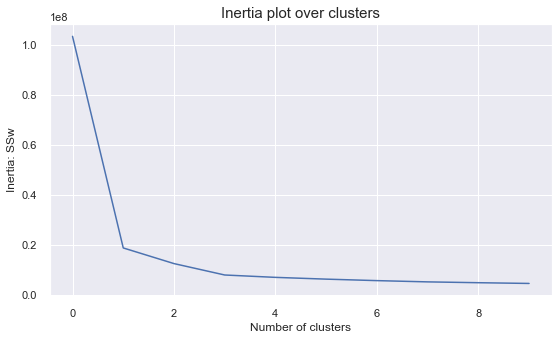

In [110]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_cen)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

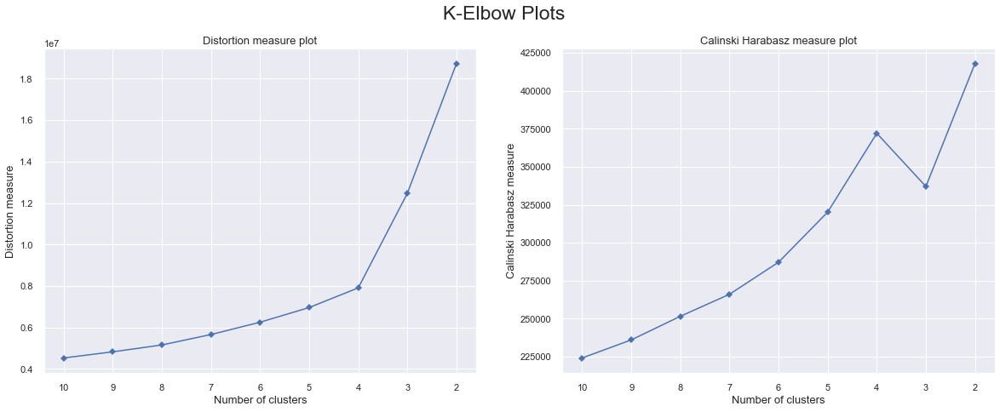

In [106]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_cen)

For n_clusters = 2, the average silhouette_score is : 0.8033192719755716
For n_clusters = 3, the average silhouette_score is : 0.6571373947652542
For n_clusters = 4, the average silhouette_score is : 0.6612884335719807
For n_clusters = 5, the average silhouette_score is : 0.6499547026765822
For n_clusters = 6, the average silhouette_score is : 0.48043122772898456
For n_clusters = 7, the average silhouette_score is : 0.2694006663666178
For n_clusters = 8, the average silhouette_score is : 0.2896051352073008
For n_clusters = 9, the average silhouette_score is : 0.27719965246433215
For n_clusters = 10, the average silhouette_score is : 0.2879278347480489


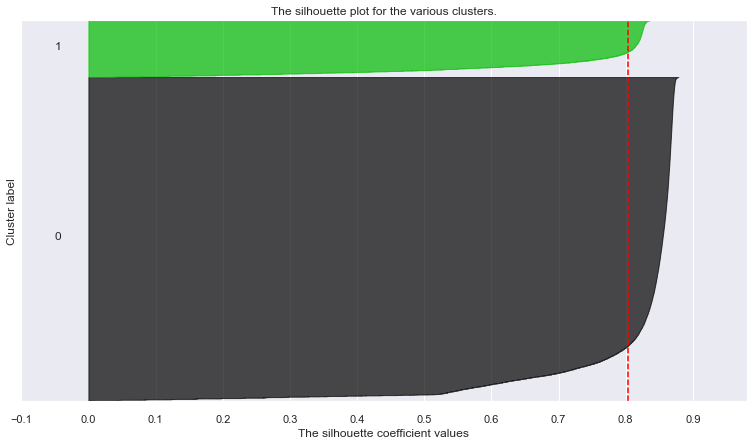

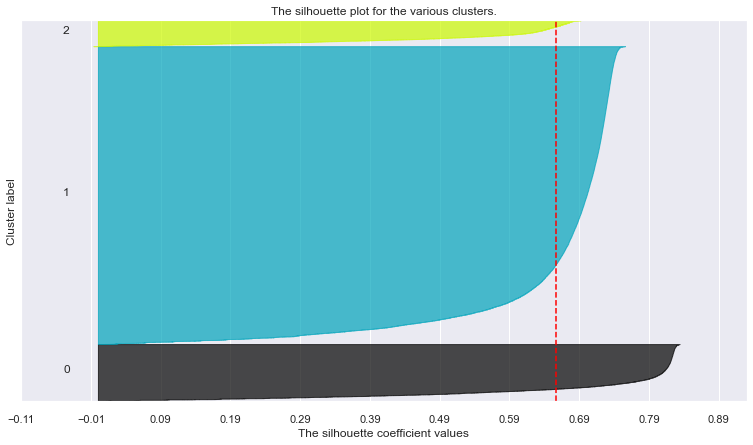

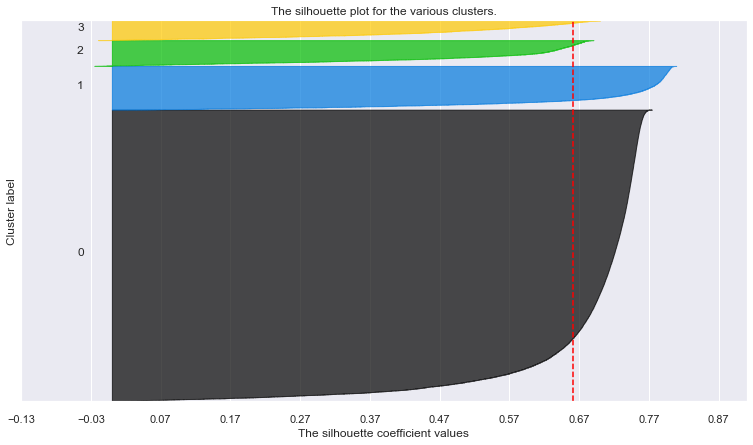

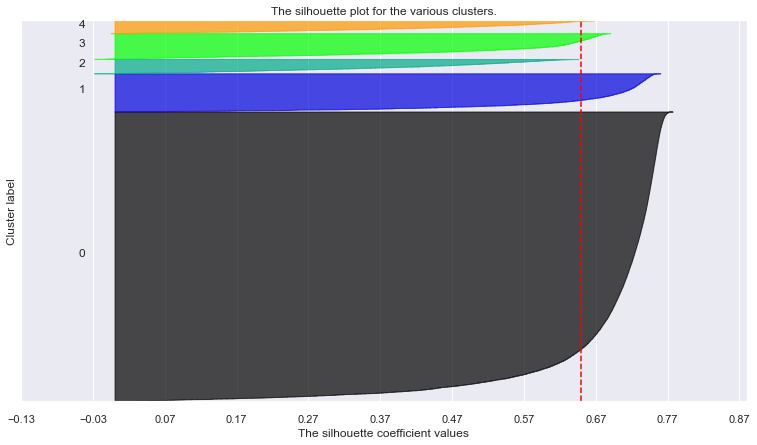

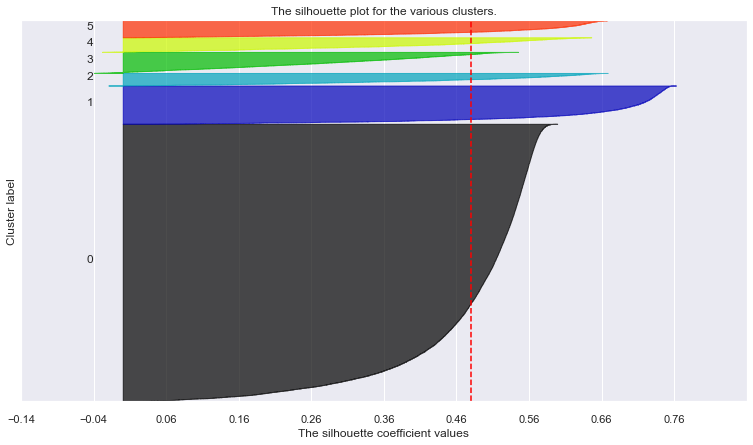

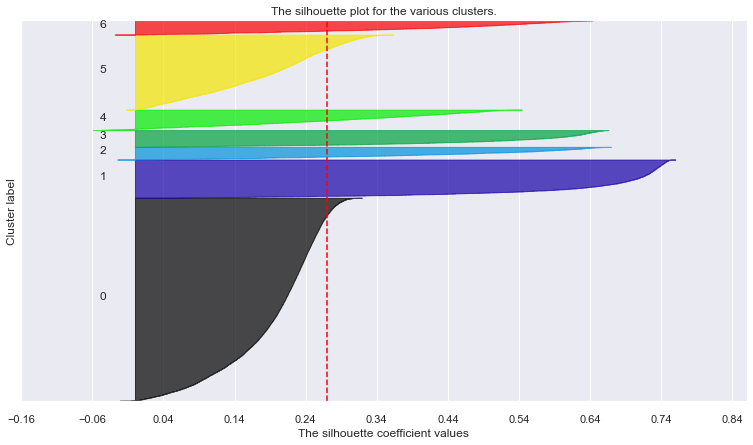

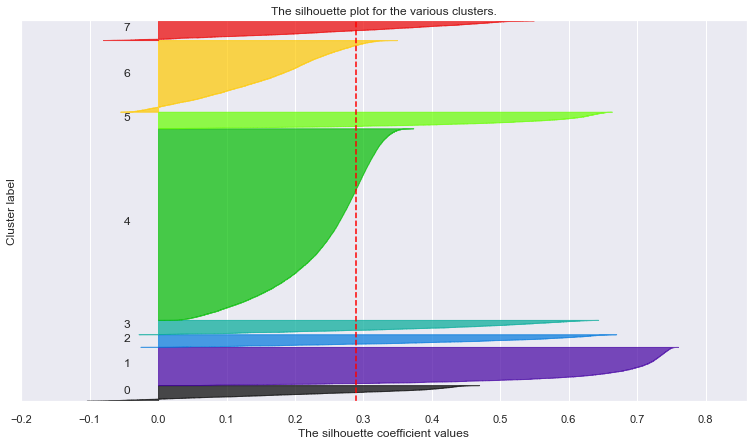

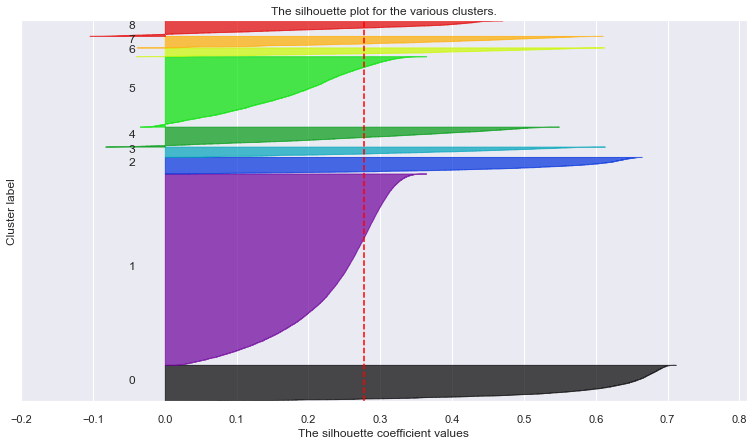

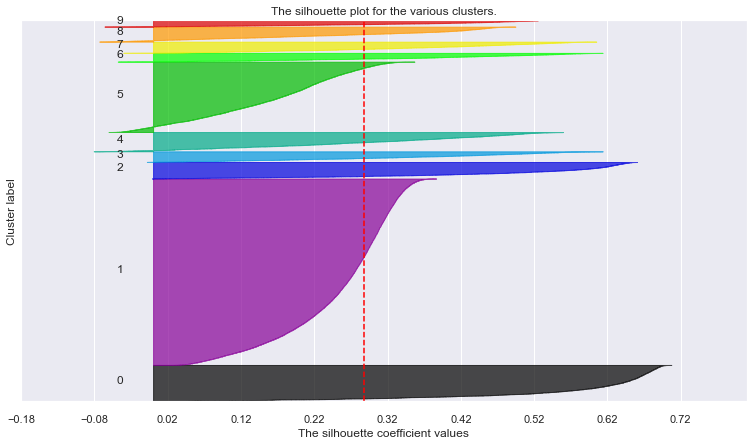

In [111]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_cen)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_cen, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_cen, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_cen) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

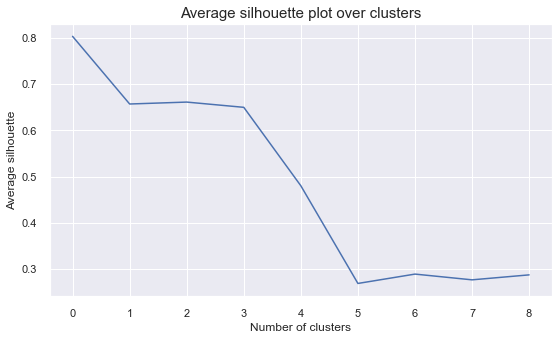

In [112]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

In [107]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_cen, 4)
kmeans_cen_df = df_cen.copy()
kmeans_cen_df["kmeans_cen_labels"] = clust_labels

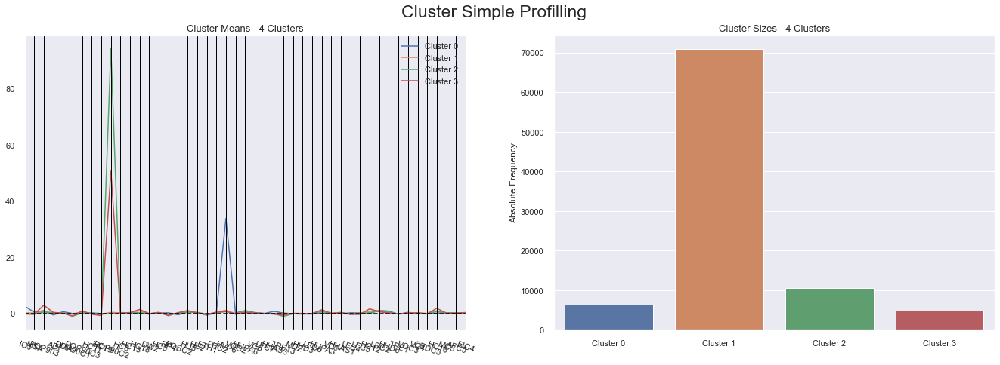

In [108]:
cluster_profiles(kmeans_cen_df, ["kmeans_cen_labels"], figsize=(23, 7))

In [109]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_cen_df, ['kmeans_cen_labels']).drop('kmeans_cen_labels').sort_values()

LFC7       0.000281
TPE1       0.001551
MC2        0.001895
MC3        0.001988
LSC2       0.002066
LFC6       0.002651
DW2        0.003644
ETH1       0.004315
HU2        0.005200
HHD3       0.005225
AFC5       0.005924
HC5        0.006327
PEC2       0.006701
HU5        0.007808
VC1        0.009433
HC13       0.009696
OEDC5      0.009927
HC8        0.010035
EIC4       0.012111
VC4        0.013194
VC3        0.013741
HUPA6      0.013825
VOC2       0.016596
HHD6       0.019036
HC16       0.021985
LFC5       0.023289
VOC3       0.023466
LFC4       0.025202
HHAS1      0.027887
HUPA3      0.032291
HC12       0.032777
POP903     0.036276
HC11       0.038425
HC18       0.042711
POBC2      0.049135
HC19       0.056870
RP4        0.062404
DMA        0.068034
POP90C3    0.071159
HHAS3      0.083932
ADI        0.090192
MSA        0.106937
TPE13      0.236340
IC5        0.301291
POP90C1    0.323454
HVP6       0.830440
POP90C2    0.979904
dtype: float64

With this cluster we were able to see the most important variables for census segmentation. We will only keep the variables that have an R2 score above 0.30. In the chapter "Clustering with the most important features" we will proceed our exploration.

In [180]:
census = r2_variables(kmeans_cen_df, ['kmeans_cen_labels']).drop('kmeans_cen_labels').sort_values().tail(4).index.to_list()

## Interests segmentation

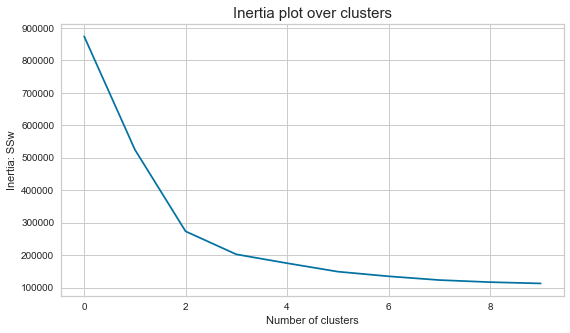

In [38]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_int)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

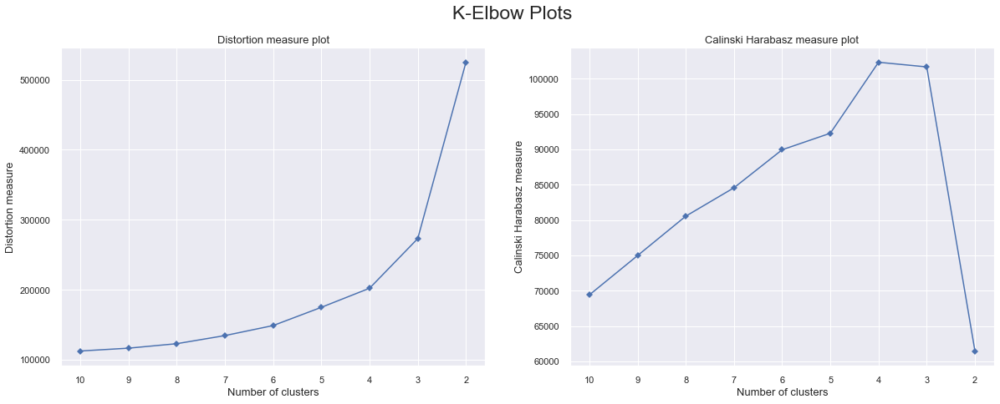

In [39]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_int)

In [113]:
r2(kmeans_cen_df, ['kmeans_cen_labels'])

0.9234772454459563

For n_clusters = 2, the average silhouette_score is : 0.696170570864834
For n_clusters = 3, the average silhouette_score is : 0.6775166963453366
For n_clusters = 4, the average silhouette_score is : 0.5439811828871688
For n_clusters = 5, the average silhouette_score is : 0.4479664985294064
For n_clusters = 6, the average silhouette_score is : 0.44885780736822356
For n_clusters = 7, the average silhouette_score is : 0.4141460282748346
For n_clusters = 8, the average silhouette_score is : 0.41922673369818003
For n_clusters = 9, the average silhouette_score is : 0.41764341447146686
For n_clusters = 10, the average silhouette_score is : 0.42752740980075465


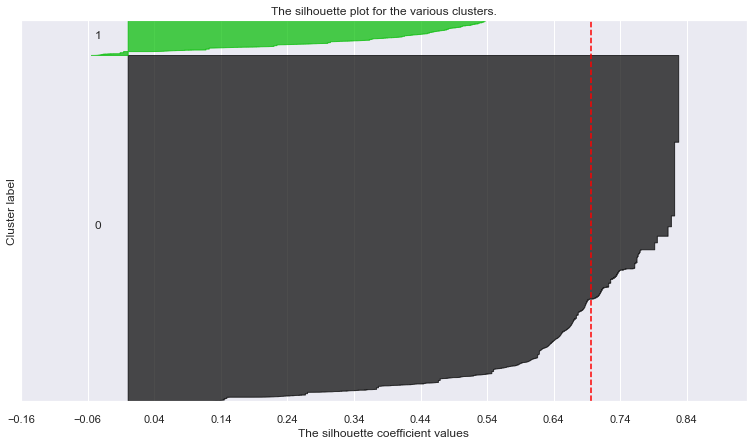

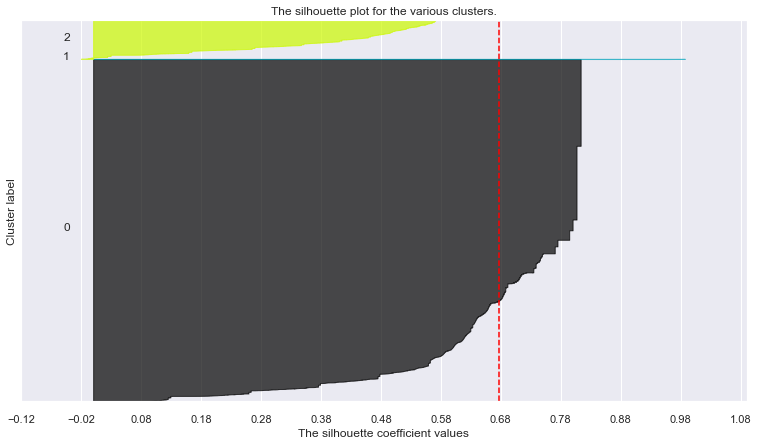

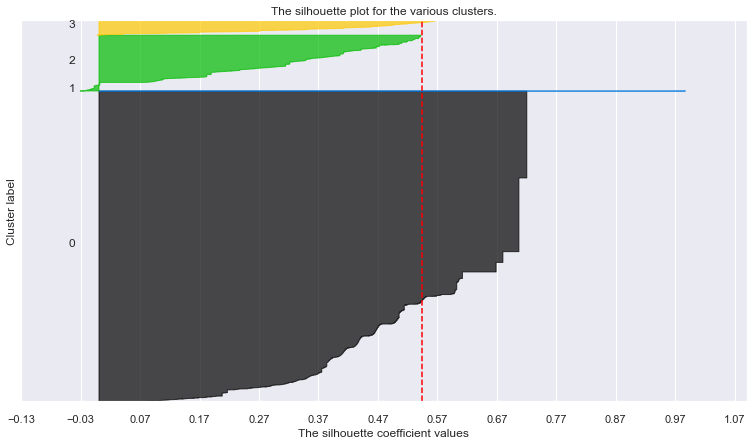

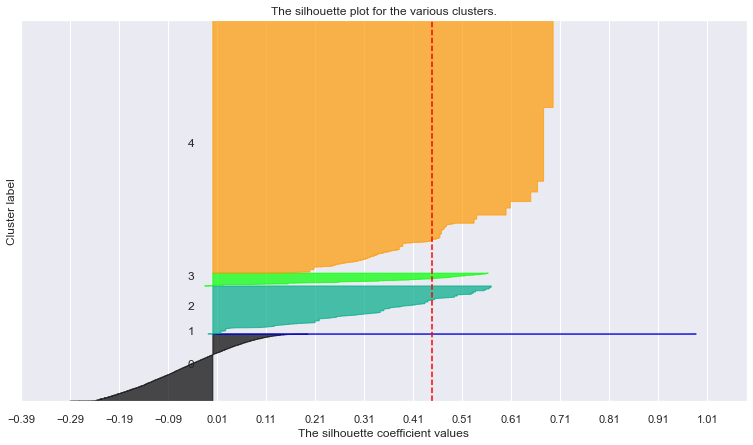

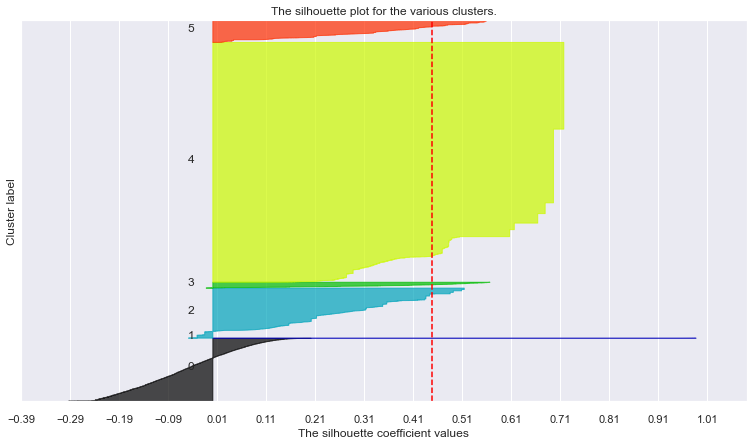

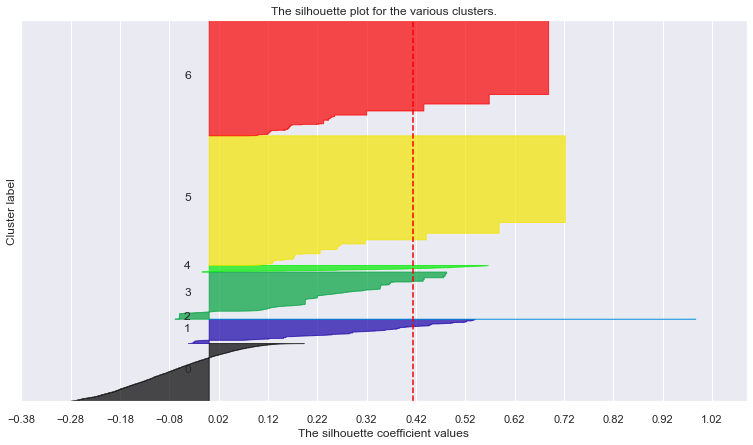

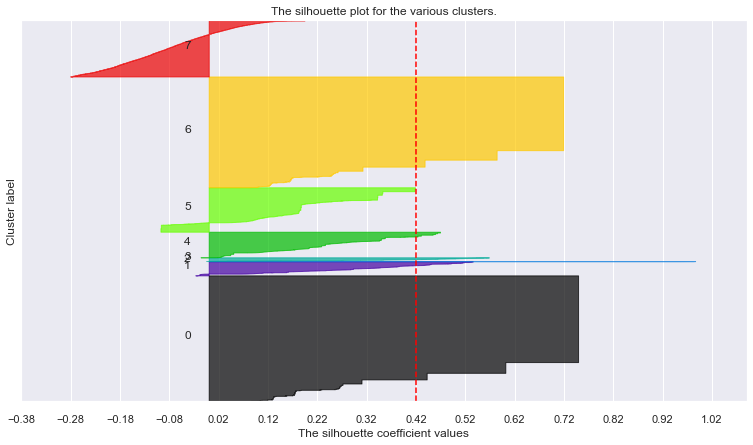

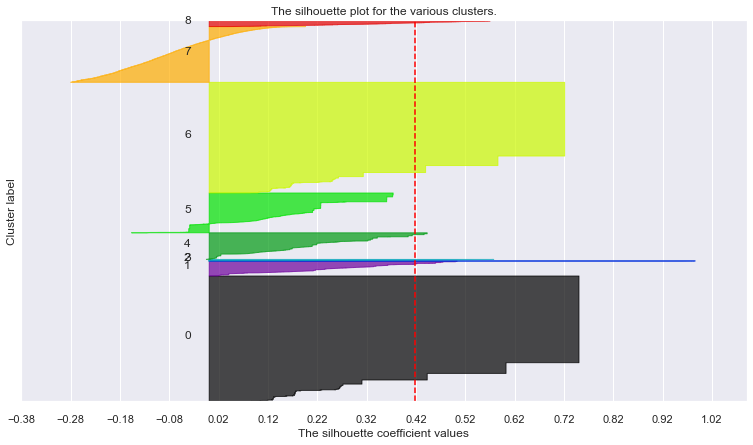

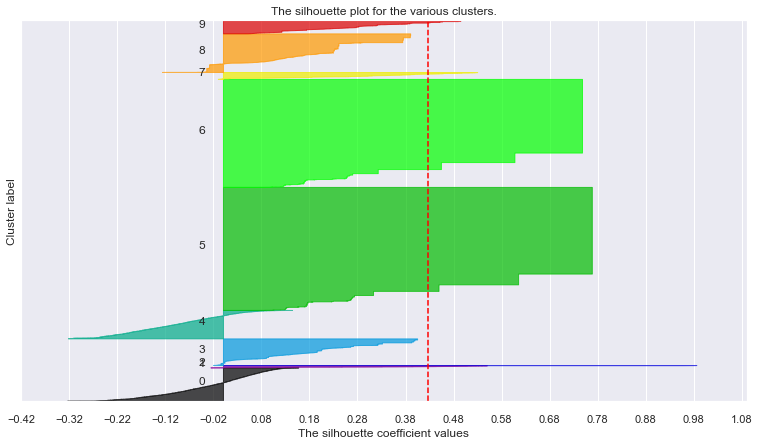

In [40]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_int)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_int, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_int, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_int) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

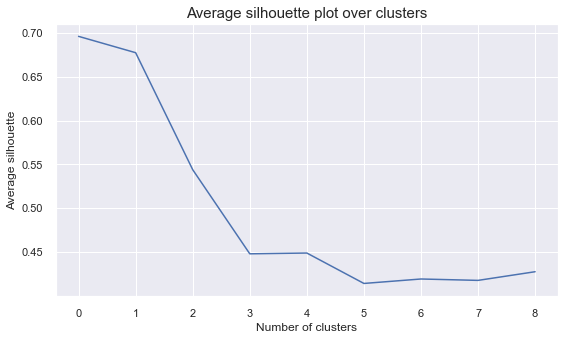

In [41]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

In [182]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_sum, 4)
kmeans_int_df = df_int.copy()
kmeans_int_df["kmeans_int_labels"] = clust_labels

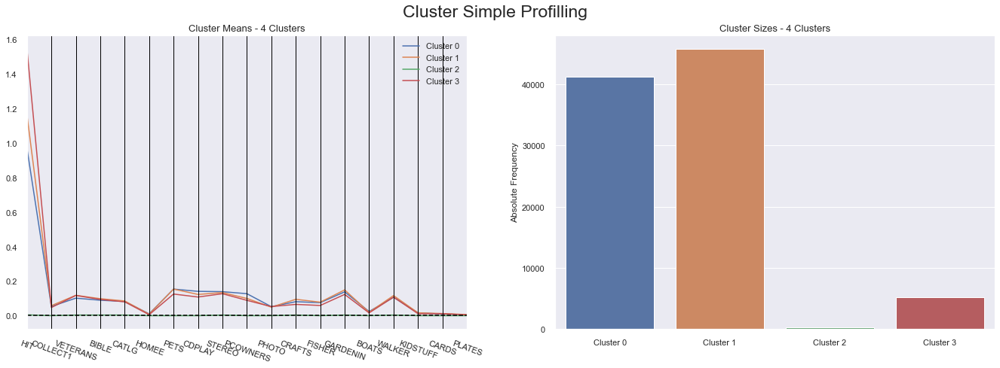

In [183]:
cluster_profiles(kmeans_int_df, ["kmeans_int_labels"], figsize=(23, 7))

In [184]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_int_df, ['kmeans_int_labels']).drop('kmeans_int_labels').sort_values()

PLATES      0.000056
KIDSTUFF    0.000142
PHOTO       0.000201
CARDS       0.000210
HOMEE       0.000232
CATLG       0.000285
COLLECT1    0.000347
BOATS       0.000369
BIBLE       0.000500
FISHER      0.000512
STEREO      0.000532
WALKER      0.000594
PETS        0.000871
GARDENIN    0.000894
VETERANS    0.001025
CRAFTS      0.001176
CDPLAY      0.001370
PCOWNERS    0.002498
HIT         0.003060
dtype: float64

Since all the variables have a low R2 we won't be keeping any of them. In other words, we won't be using the interests segmentation.

# Clustering with the most important variables

In [185]:
df_dem[demg]

,INCOME,AGE,NUMCHLD
CONTROLN,,,
95515,-0.5,0.000000,0.0
148535,1.0,-0.789474,1.0
15078,-0.5,0.052632,0.0
172556,-1.5,0.473684,0.0
7112,-0.5,0.894737,1.0
...,...,...,...
184568,-0.5,0.052632,0.0
122706,1.5,-0.684211,1.0
189641,-0.5,-0.052632,0.0


In [186]:
df_sum[summ]

,MINRAMNT,CARDGIFT,PEPSTRFL,RFA_2A,MAXRAMNT,LASTGIFT,AVGGIFT,NUMPRM12,MAXADATE
CONTROLN,,,,,,,,,
95515,0.000000,2.0,1.0,-1.0,-0.555556,-0.5,-0.552749,1.0,0.0
148535,0.714286,-0.6,0.0,1.0,0.888889,1.0,0.575326,0.5,0.0
15078,-0.428571,2.0,1.0,-1.0,-0.111111,-1.0,-0.589825,1.0,0.0
172556,-0.428571,0.6,1.0,-1.0,-0.666667,-0.5,-0.685053,1.0,0.0
7112,-0.285714,0.8,0.0,0.0,-0.222222,0.0,-0.677599,6.5,0.0
...,...,...,...,...,...,...,...,...,...
184568,2.857143,-0.8,0.0,1.0,0.888889,1.0,1.903915,0.0,0.0
122706,2.142857,-0.8,0.0,0.0,0.333333,0.5,1.192171,-2.0,0.0
189641,-0.285714,0.0,1.0,-1.0,-0.777778,-0.5,-0.475343,2.5,0.0


In [187]:
df_cen[census]

,IC5,POP90C1,HVP6,POP90C2
CONTROLN,,,,
95515,-0.124410,-1.000000,0.0,35.0
148535,3.039082,0.000000,47.0,0.0
15078,-0.301925,-1.000000,0.0,2.0
172556,0.180775,-1.000000,5.0,8.0
7112,-0.538250,0.000000,0.0,0.0
...,...,...,...,...
184568,0.680181,0.000000,0.0,0.0
122706,1.730196,-0.030303,2.5,0.0
189641,-0.220162,0.000000,0.0,0.0


### Finding the optimal clusterer 

In [53]:
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from sklearn.base import clone
from sklearn.metrics import pairwise_distances
from scipy.cluster.hierarchy import dendrogram
from sklearn.manifold import TSNE
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import train_test_split
import graphviz

sns.set()

In [115]:
# Obtaining the R² scores for each cluster solution on demographic variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_pca2[pc_features], kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:  #hierarchical
    r2_scores[linkage] = get_r2_scores(
        df_pca2[pc_features], hierarchical.set_params(linkage=linkage)
    )

pd.DataFrame(r2_scores)

MemoryError: Unable to allocate 29.1 GiB for an array with shape (3909269253,) and data type float64

### Kmeans

In [304]:
# final cluster solution
number_clusters = 4
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels = kmclust.fit_predict(df_pca2[pc_features])
km_labels

array([0, 2, 3, ..., 2, 2, 0])

In [305]:
pc_features

Index(['PC0', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9',
       'PC10', 'PC11', 'PC12', 'PC13', 'PC15', 'PC16', 'PC18'],
      dtype='object')

In [306]:
#anter de fazer isto tenho de fazer inertia e ver numero de clusters

In [307]:
# Characterizing the final clusters
df_concat2 = pd.concat((df_pca2, pd.Series(km_labels, name='labels')), axis=1)
df_concat2.groupby('labels').mean()

,TCODE,ZIP,AGE,HOMEOWNR,NUMCHLD,INCOME,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,TIMELAG,HPHONE_D,neighborhood,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC15,PC16,PC18
labels,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.0,0.004747,-0.778526,-0.002827,0.026228,0.030948,-0.047876,-0.000151,0.027102,0.014551,0.011762,0.048238,0.013873,-0.010045,0.002659,0.006646,0.019113,-0.016129,0.000074,0.037635,0.025121,0.022933,0.007972,0.016034,0.009512,0.001863,-0.006315,0.042699,-0.059800,0.083232,0.193136,0.057291,0.045394,-0.021724,0.027631,0.007712,0.026587,-0.005706,-0.039511,-0.018468,0.117374,0.009287,0.059566,0.192444,0.023642,-0.084905,0.033699,-0.023162,0.180085,-0.547305,-0.169648,0.210603,-0.007937,-0.005522,-0.112059,-0.267811,-0.077200,-0.142616,-0.031608
1.0,-0.035193,-0.756865,0.005818,0.052304,0.049701,-0.046342,-0.029268,0.083617,0.029000,0.058364,0.050844,-0.006083,0.018624,-0.013179,-0.044011,0.009321,-0.030746,-0.022267,-0.044448,0.027111,0.031487,0.073759,0.016226,0.056347,-0.010482,0.019546,0.041577,-0.059800,0.094960,0.176254,0.100958,0.074606,-0.006242,0.048884,0.031169,0.046356,0.060740,0.021928,-0.021067,0.166249,-0.054442,0.035851,0.216944,0.095981,-0.010918,0.083398,-0.052146,0.198401,-0.552929,-0.124188,0.167866,0.024668,-0.020730,-0.157835,-0.318746,-0.046202,-0.175138,-0.042491
2.0,-0.005023,-0.763488,0.009992,0.033856,0.011700,-0.039197,0.005421,0.036369,0.018172,0.020954,0.029097,0.014577,-0.001212,0.000384,0.003756,0.024200,-0.014856,0.014882,0.016315,0.017903,0.013509,0.030507,0.012252,0.001239,-0.004878,0.015022,0.059283,-0.059800,0.086956,0.223129,0.063980,0.074753,-0.047435,0.050387,-0.002924,0.046656,-0.009766,-0.041422,-0.008227,0.103124,0.010268,0.049545,0.244877,0.017967,-0.086864,0.031265,-0.027636,0.171365,-0.517059,-0.150108,0.203409,0.021406,-0.028978,-0.105682,-0.268244,-0.086986,-0.149035,-0.043692
3.0,0.003289,-0.783229,-0.000960,0.034845,0.007113,-0.049635,-0.010023,0.017164,0.013619,0.006531,0.021280,-0.000763,0.003212,-0.001126,-0.011160,-0.013258,-0.015440,-0.003494,0.012022,0.010192,-0.002020,0.001712,0.004219,0.001630,0.010267,-0.015705,0.048680,-0.056336,0.086071,0.208261,0.068140,0.064476,-0.037634,0.030145,0.010937,0.039228,-0.006245,-0.020349,-0.005998,0.094205,-0.004481,0.004993,0.210487,0.020660,-0.075905,0.034613,-0.029210,0.162424,-0.525917,-0.166173,0.214775,0.008740,-0.009623,-0.116912,-0.283038,-0.073385,-0.159795,-0.039820


In [308]:
df_pca2['pc_feature'] = km_labels

In [309]:
df_pca2[pc_features.to_list() +['pc_feature']]

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC15,PC16,PC18,pc_feature
CONTROLN,,,,,,,,,,,,,,,,,,
95515.0,-1.746873,2.145076,-0.421548,0.071450,0.014100,0.808486,-1.368334,0.134907,-0.171827,-0.714645,0.172427,0.729790,-0.641092,-0.993480,-0.142218,0.060894,0.249595,0
148535.0,-0.569197,-1.694881,1.050618,-0.832671,0.274501,-2.037516,-0.245218,1.400511,0.799919,-0.021548,0.811335,1.142470,-0.605262,-0.009087,0.305026,0.604822,0.538322,2
148547.0,5.017778,0.295748,0.254530,-0.366922,-1.593325,-0.289863,-0.413736,2.359916,-0.409661,-1.005597,-0.123318,1.340761,-0.519186,0.526726,-1.469418,-2.093215,-0.059414,3
15078.0,-1.615439,2.591082,-0.902910,0.447896,0.056594,-0.004121,-0.082721,-0.868551,-0.509606,0.379570,0.860921,0.726907,-0.961492,-1.541451,-0.419080,0.174212,0.722734,0
15079.0,1.451328,0.064182,0.399365,-0.338617,-0.291272,-0.247090,-2.529474,-1.493698,-0.083392,0.565281,1.419475,0.073509,-0.941042,-2.137123,-0.234118,-0.873742,1.146521,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47945.0,-1.416877,-1.196655,-0.424397,-1.323887,-0.107855,1.206517,-0.353800,-1.208998,-0.323524,0.571471,-0.874159,-1.314082,0.662526,0.452306,-0.314155,-0.384065,-0.210784,2
84678.0,-1.252867,0.525380,-0.535101,1.388497,0.087689,-0.418293,-0.438260,-0.222034,0.389406,0.583703,-0.478075,-0.987041,0.660644,1.344172,0.380063,-0.441404,-0.700526,0
156106.0,-1.437056,-1.930014,1.321903,-0.080283,-0.168650,1.170019,-0.235513,0.905019,0.959910,1.250808,-0.529813,-1.110950,0.670874,1.208254,-0.059961,0.129673,1.090705,2


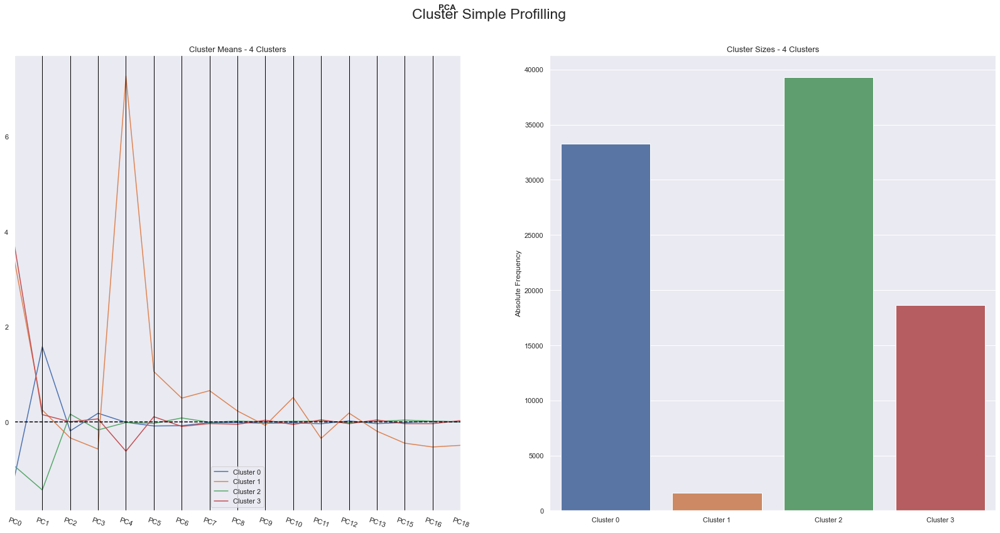

In [310]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    df = df_pca2[pc_features.to_list() +['pc_feature']], 
    label_columns = ['pc_feature'], 
    figsize = (28, 13), 
    compar_titles = ["PCA"]
)


#add boxplot, hist to this


### R2 score

In [311]:
r2(df_pca2[pc_features], km_labels)

0.2527240544705499

In [151]:
prof = ProfileReport(d[categorical_data])
prof.to_file(output_file='profiling2.html')

## References:
Deal with nan values:
https://stackoverflow.com/questions/50670080/mice-implementation-in-python
https://stackoverflow.com/questions/45321406/missing-value-imputation-in-python-using-knn
https://stackoverflow.com/questions/45239256/data-imputation-with-fancyimpute-and-pandas
https://stackoverflow.com/questions/54059964/can-not-use-mice-from-fancyimputer-python


Use mean or median:
https://www.wcc.nrcs.usda.gov/normals/median_average.htm